# EDA_Enfermedades_Cardiacas
##### Cristina Hidalgo

Según las estadísticas de la OMS, cada año mueren 17,9 millones por enfermedades del corazón.
El estudio médico dice que el estilo de vida humano es la razón principal detrás de este problema cardíaco.
Aparte de esto, hay muchos factores clave que advierten que la persona puede o no tener riesgo de enfermedad cardíaca.

¿Cómo se podrían estimar los factores de riesgo de desarrollar una enfermedad cardiovascular en los próximos años?

## Introducción <a name="Introducción"></a>

**Problema:**
La principal causa de muerte en los países desarrollados se deben a enfermedades cardiovasculares. Las cardiopatías son desde hace 20 años la causa principal de mortalidad en todo el mundo, si bien ahora provocan más muertes que nunca. El pronóstico temprano de las enfermedades cardiovasculares puede ayudar en la toma de decisiones sobre cambios en el estilo de vida en pacientes de alto riesgo y/o a reducir las complicaciones de la enfermedad. Esta investigación tiene como hipótesis inicial la intención de identificar los factores de riesgo más relevantes de la enfermedad cardíaca.

**Fuente:**
El conjunto de datos ha sido recogido por la organización Framingham Heart Study y está disponible públicamente en el sitio web: https://www.framinghamheartstudy.org/ y en https://ocw.mit.edu/courses/15-071-the-analytics-edge-spring-2017/resources/framingham/. Estos datos provienen de un estudio cardiovascular en curso en los residentes de la ciudad de Framingham, Massachusetts. El objetivo de la clasificación es predecir si el paciente tiene un riesgo de enfermedad cardiaca (CHD) en los próximos 10 años (CHD10)
El conjunto de datos proporciona la información de los pacientes e incluye más de 4.000 registros y 15 atributos (factores de riesgo potencial). Existen factores de riesgo tanto demográficos como de hábitos y médicos.

***Atributos:***
##### Demográfico:
* 0 - Sexo: 0-femenino y 1-masculino. (Categórica).
* 1 - Edad: Edad del paciente (años). (Numérica).
* 2 - Educación: [1- Educación Secundaria Obligatoria, 2- Bachillerato, 3-Formación Profesional de grado medio o superior, 4- Universidad]. (Categórica).

##### Hábitos:
* 3 - Fumador Actual: si el paciente es (1) o no (0) fumador actual. (Categórica) .
* 4 - Cigarillos día: la cantidad de cigarrillos que la persona fumó en promedio en un día (puede considerarse continuo ya que uno puede tener cualquier cantidad de cigarrillos, incluso medio cigarrillo). (Numérica).

##### Información sobre el historial médico en el momento del primer examen.:
* 5 - Meds PA: si el paciente tomaba o no medicamentos para la presión arterial en el momento del primer examen. (Categórica).
* 6 - Ictus prev: si el paciente ha tenido o no un ictus previo al momento del primer examen. (Categórica).
* 7 - Hipertensión: si el paciente era o no hipertenso en el momento del primer examen. (Categórica).
* 8 - Diabetes: si el paciente tenía o no diabetes en el momento del primer examen. (Categórica).

##### Información sobre la condición médica actual:
* 9 - Colesterol: nivel de colesterol total en la actualidad (mg/dL). (Numérica).
* 10 - PAS: presión arterial sistólica en la actualidad (mmHg). Se trata de la presión máx que ejerce el corazón al latir. (Numérica).
* 11 - PAD: presión arterial diastólica en la actualidad (mmHg). Se trata de la presión arterial entre latidos. (Numérica).
* 12 - IMC: Índice de Masa Corporal en la actualidad (kg/m2). (Numérica).
* 13 - RC: frecuencia cardíaca en la actualidad (latidos/min). (Numérica).
* 14 - Glucosa: nivel de glucosa en la actualidad (mg/dL). (Numérica).

##### Variable de destino para predecir:
* 15 - CHD10: Se trata de una variable binaria que indica si una persona tiene un riesgo de desarrollar una enfermedad coronaria en los próximos 10 años. Un valor de “1” significa que la persona tiene un riesgo de desarrollar una enfermedad coronaria en los próximos 10 años, mientras que un valor de “0” significa que la persona no tiene un riesgo significativo de sufrirlo. (Categórica).

### ¿Qué es la CHD?

La enfermedad coronaria (CHD, por sus siglas en inglés) es una afección en la que las arterias coronarias, que suministran sangre al músculo cardíaco, se estrechan o se bloquean debido a la acumulación de placa. Esto puede reducir el flujo de sangre al corazón y aumentar el riesgo de sufrir un ataque cardíaco o angina de pecho.

La variable de destino “Riesgo en 10 años de enfermedad coronaria (CHD10)" puede ser útil para identificar a las personas que podrían beneficiarse de intervenciones preventivas, como cambios en el estilo de vida o medicamentos para reducir el riesgo de enfermedad coronaria.

## Análisis Exploratorio de Datos (EDA) <a name="EDA"></a>

### Importación de librerías

In [1]:
import numpy as np
import pandas as pd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%config InlineBackend.figure_format ='retina'
%matplotlib inline

La fuente de datos es: https://www.framinghamheartstudy.org/

In [3]:
data_origen = pd.read_csv('./data/framingham.csv', sep=',', encoding='latin-1')

### Información de los datos recogidos

In [4]:
data_origen.shape

(4238, 16)

In [5]:
data_origen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Sexo             4238 non-null   int64  
 1   Edad             4238 non-null   int64  
 2   Educación        4133 non-null   float64
 3   Fumador Actual   4238 non-null   int64  
 4   Cigarrillos día  4209 non-null   float64
 5   Meds PA          4185 non-null   float64
 6   Ictus prev       4238 non-null   int64  
 7   Hipertensión     4238 non-null   int64  
 8   Diabetes         4238 non-null   int64  
 9   Colesterol       4188 non-null   float64
 10  PAS              4238 non-null   float64
 11  PAD              4238 non-null   float64
 12  IMC              4219 non-null   float64
 13  RC               4237 non-null   float64
 14  Glucosa          3850 non-null   float64
 15  CHD10            4238 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 529.9 KB


Mostramos las primeras líneas del csv utilizado.

In [6]:
data_origen.describe()

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
count,4238.000000,4238.000000,4133.000000,4238.000000,4209.000000,4185.000000,4238.000000,4238.000000,4238.000000,4188.000000,4238.000000,4238.000000,4219.000000,4237.000000,3850.000000,4238.000000
mean,0.429212,49.584946,1.978950,0.494101,9.003089,0.029630,0.005899,0.310524,0.025720,236.721585,132.352407,82.893464,25.802008,75.878924,81.966753,0.151958
std,0.495022,8.572160,1.019791,0.500024,11.920094,0.169584,0.076587,0.462763,0.158316,44.590334,22.038097,11.910850,4.080111,12.026596,23.959998,0.359023
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,89.875000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


In [7]:
data_origen

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0


### Comprobación Valores Nulos

In [8]:
data_origen.isnull().sum()

Sexo                 0
Edad                 0
Educación          105
Fumador Actual       0
Cigarrillos día     29
Meds PA             53
Ictus prev           0
Hipertensión         0
Diabetes             0
Colesterol          50
PAS                  0
PAD                  0
IMC                 19
RC                   1
Glucosa            388
CHD10                0
dtype: int64

Creamos un nuevo df con aquellas filas que contengan datos nulos y los analizamos.

In [9]:
data_origen_null = data_origen[data_origen.isnull().any(axis=1)]
data_origen_null

,Sexo,Edad,Educación,Fumador Actual,Cigarrillos día,Meds PA,Ictus prev,Hipertensión,Diabetes,Colesterol,PAS,PAD,IMC,RC,Glucosa,CHD10
14,0,39,2.0,1,9.0,0.0,0,0,0,226.0,114.0,64.0,22.35,85.0,NaN,0
21,0,43,1.0,0,0.0,0.0,0,0,0,185.0,123.5,77.5,29.89,70.0,NaN,0
26,0,60,1.0,0,0.0,0.0,0,0,0,260.0,110.0,72.5,26.59,65.0,NaN,0
33,1,61,NaN,1,5.0,0.0,0,0,0,175.0,134.0,82.5,18.59,72.0,75.0,1
36,1,56,NaN,0,0.0,0.0,0,0,0,257.0,153.5,102.0,28.09,72.0,75.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4208,0,51,1.0,1,9.0,0.0,0,0,0,340.0,152.0,76.0,25.74,70.0,NaN,0
4229,0,51,3.0,1,20.0,0.0,0,1,0,251.0,140.0,80.0,25.60,75.0,NaN,0
4230,0,56,1.0,1,3.0,0.0,0,1,0,268.0,170.0,102.0,22.89,57.0,NaN,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0


### **Comprobación Valores Duplicados**

In [10]:
data_origen.duplicated().sum()

0

No hay datos duplicados.

### **Comprobación Outliers**

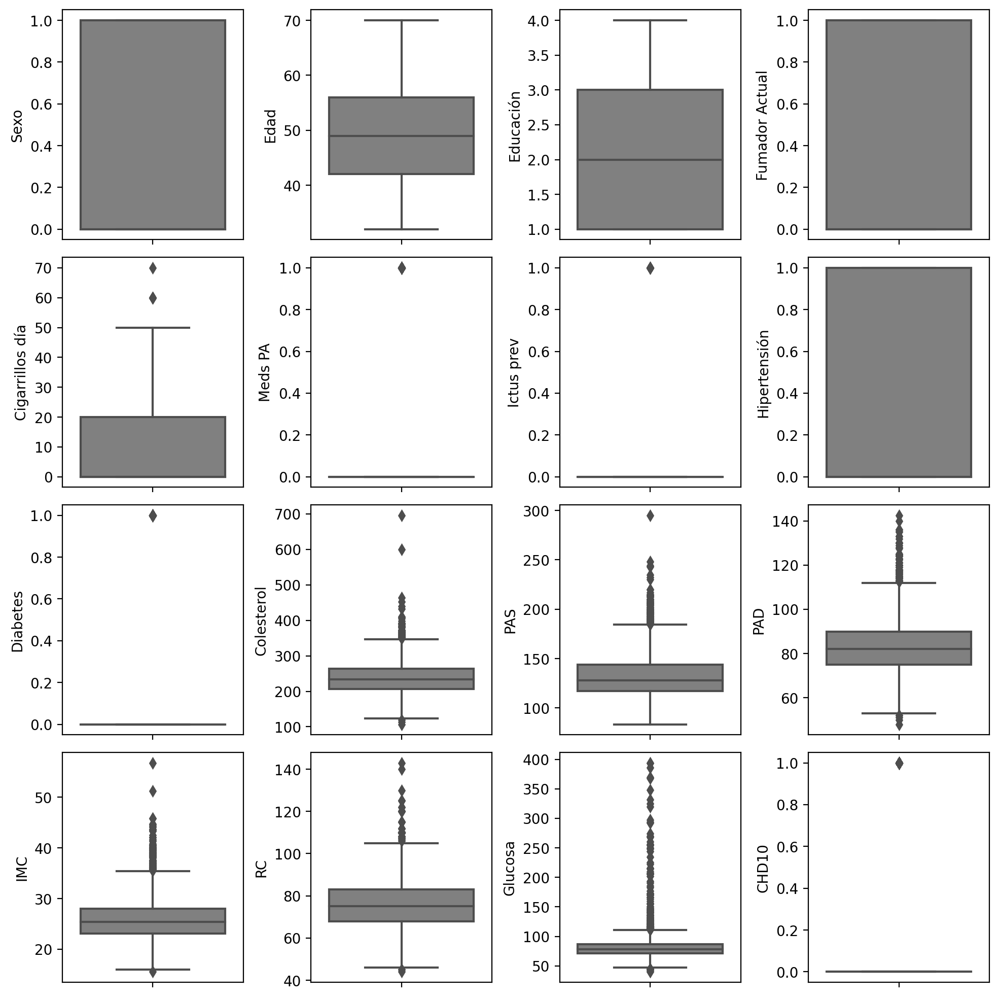

In [11]:
fig, ax = plt.subplots(figsize=(10,10), nrows=4, ncols=4)
ax = ax.flatten()

i = 0
for f,c in data_origen.items():
    sns.boxplot(y=c, ax=ax[i], palette=["gray"])
    i+=1
    if i==16:
        break
plt.tight_layout(pad=1.25, h_pad=0.8, w_pad=0.8);

De este boxplot podemos observar outliers en las variables "Colesterol", "PAS", "IMC", "RC" y "Glucosa".
Por ahora no vamos a eliminar los outliers ya que no afectan al análisis exploratorio de datos, pero para el Machine Learning sí será necesario.

In [12]:
# Eliminación de outliers.

data = data_origen.copy()
# Eliminar filas donde la columna 'PAS' es mayor que 220
data = data_origen.loc[data_origen['PAS'] <= 220]

# Eliminar filas donde la columna 'IMC' es mayor que 50
data = data_origen.loc[data_origen['IMC'] <= 50]

# Eliminar filas donde la columna 'RC' es mayor que 125
data = data_origen.loc[data_origen['RC'] <= 125]

# Eliminar filas donde la columna 'Glucosa' es mayor que 200
data = data_origen.loc[data_origen['Glucosa'] <= 200]

# Eliminar filas donde la columna 'Colesterol' es mayor que 450
data = data_origen.loc[data_origen['Colesterol'] <= 450]


print(data.shape)

(4184, 16)


In [13]:
#¿Cuántos outliers se han eliminado en total?

print('Cantidad de outliers eliminados es de: ',len(data_origen[data_origen['PAS'] > 220]) + len(data_origen[data_origen['IMC'] > 43]) + len(
    data_origen[data_origen['RC'] > 125]) + len(data_origen[data_origen['Glucosa'] > 200]) + len(
    data_origen[data_origen['Colesterol'] > 450]))

Cantidad de outliers eliminados es de:  60


Para visualizar la distribución de los datos para cada variable se crea un histograma para cada uno de ellos en una misma figura.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\2575382605.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  data.hist(ax = ax, color='gray')


array([[<Axes: title={'center': 'Sexo'}>,
        <Axes: title={'center': 'Edad'}>,
        <Axes: title={'center': 'Educación'}>,
        <Axes: title={'center': 'Fumador Actual'}>],
       [<Axes: title={'center': 'Cigarrillos día'}>,
        <Axes: title={'center': 'Meds PA'}>,
        <Axes: title={'center': 'Ictus prev'}>,
        <Axes: title={'center': 'Hipertensión'}>],
       [<Axes: title={'center': 'Diabetes'}>,
        <Axes: title={'center': 'Colesterol'}>,
        <Axes: title={'center': 'PAS'}>, <Axes: title={'center': 'PAD'}>],
       [<Axes: title={'center': 'IMC'}>, <Axes: title={'center': 'RC'}>,
        <Axes: title={'center': 'Glucosa'}>,
        <Axes: title={'center': 'CHD10'}>]], dtype=object)

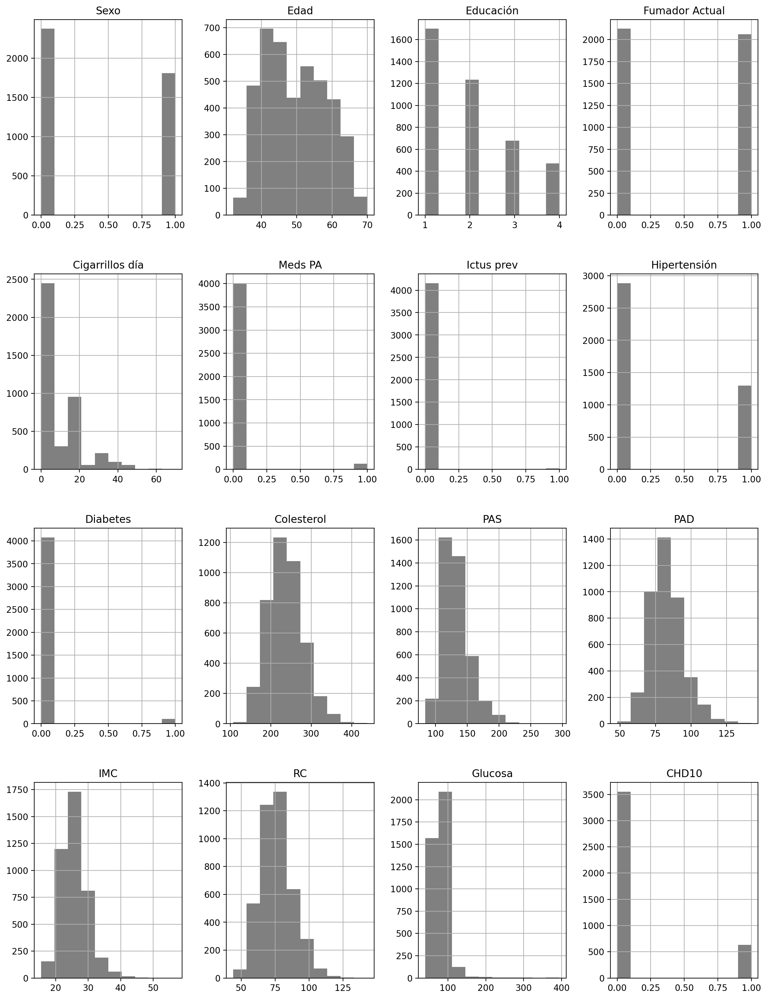

In [14]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
data.hist(ax = ax, color='gray')

Obtenido el histograma de las diferentes variables vamos a analizar la relación que existe entre ellas, es decir, vamos a comprobar que variables están correlacionadas entre sí y con el resultado.
Para ello, crearemos un mapa de calor.
Un mapa de calor es una representación gráfica de datos donde los valores individuales en una matriz se representan como colores. En este caso, los valores en la matriz de correlación se representan como colores en el mapa de calor, lo que permite ver rápidamente qué características están correlacionadas entre sí.

<Figure size 1500x1500 with 0 Axes>

<Axes: >

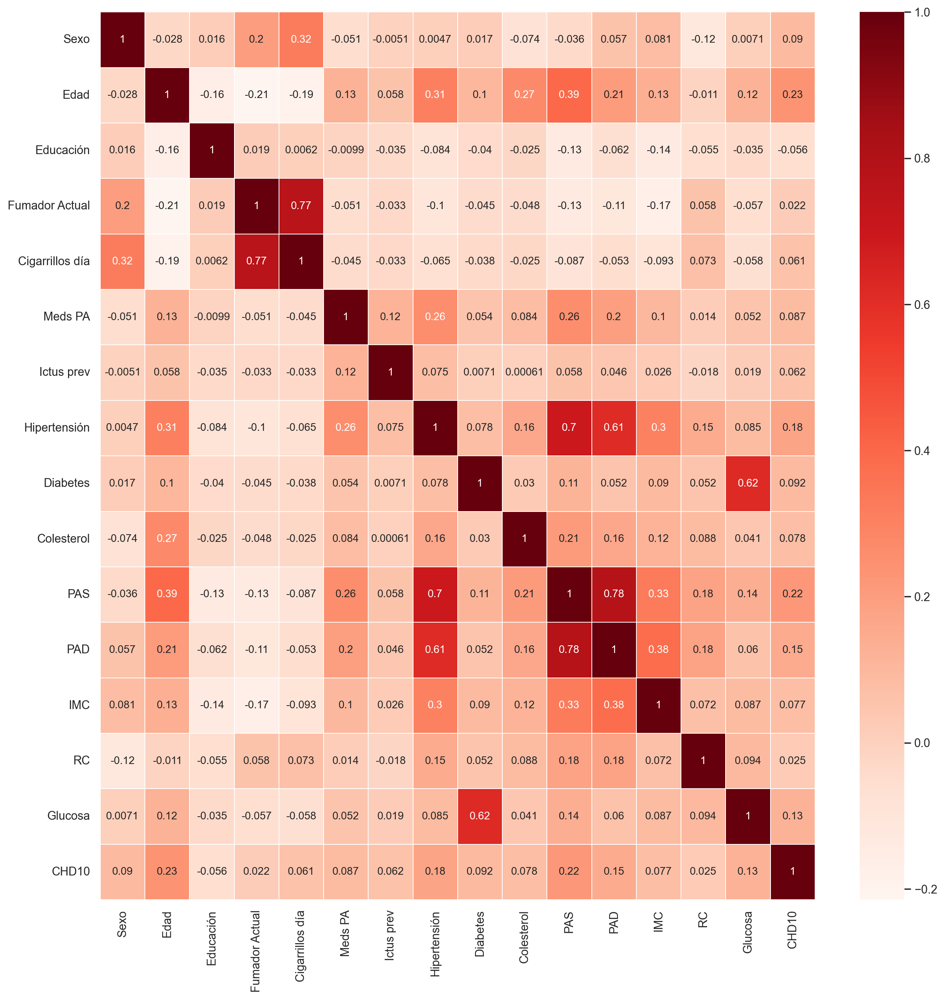

In [15]:
corr_data = data.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=1)
sns.heatmap(corr_data, cmap='Reds', annot=True, linewidths=0.1, annot_kws={"fontsize":10})
plt.show()

El coeficiente de correlación mide la relación lineal entre dos variables y varía entre -1 y 1. Un valor cercano a 1 indica una fuerte correlación positiva, un valor cercano a -1 indica una fuerte correlación negativa y un valor cercano a 0 indica una falta de correlación.

Del heatmap se puede observar una fuerte relación entre "PAS", "PAD" e "Hipertensión" y entre "Fumador Actual" y "Cigarrillos día".

In [16]:
data_correlacion = data.loc[:, ["PAS", "PAD", "Hipertensión", "Fumador Actual", "Cigarrillos día"]]
data_correlacion

,PAS,PAD,Hipertensión,Fumador Actual,Cigarrillos día
0,106.0,70.0,0,0,0.0
1,121.0,81.0,0,0,0.0
2,127.5,80.0,0,1,20.0
3,150.0,95.0,1,1,30.0
4,130.0,84.0,0,1,23.0
...,...,...,...,...,...
4233,179.0,92.0,1,1,1.0
4234,126.5,80.0,0,1,43.0
4235,131.0,72.0,0,1,20.0
4236,126.5,87.0,0,1,15.0


<Figure size 1500x1500 with 0 Axes>

<Axes: >

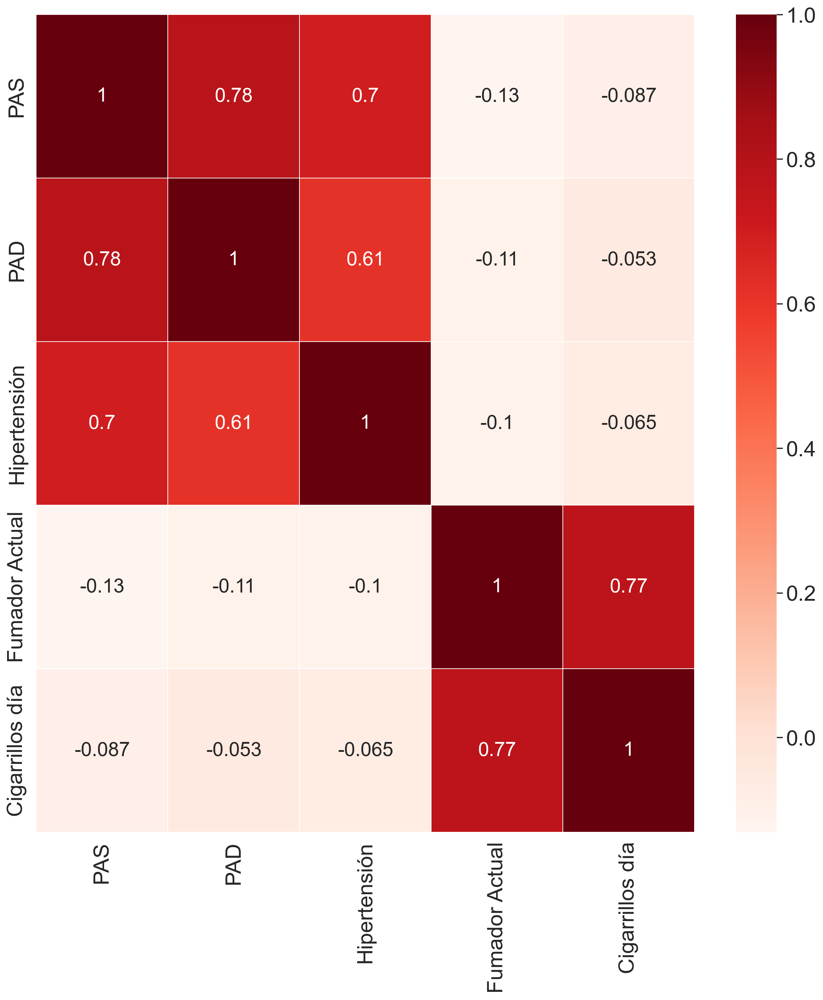

In [17]:
corr_data2 = data_correlacion.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=2)
sns.heatmap(corr_data2, cmap='Reds', annot=True, linewidths=0.1, annot_kws={"fontsize":20})
plt.show()

**Conclusiones de la correlación:**

Se fija un valor de 0.75 como indicador de fuerte correlación. Del heatmap se observa que entre la variabla PAS y PAD existe una relación de 0.78 y, como en la práctica, una presión arterial sistólica alta conlleva una presión arterial diastólica alta se procede a eliminar el PAD ya que es la que menor correlación tiene con nuestra variable de salida CHD10. 

La presión arterial sistólica es la presión que ejerce la sangre sobre las paredes de las arterias cuando el corazón se contrae y bombea sangre hacia el cuerpo. La presión arterial diastólica es la presión que ejerce la sangre sobre las paredes de las arterias cuando el corazón está en reposo entre latidos. Es decir, una PAS elevada conlleva una PAD elevada.

También se observa una fuerte correlación fuerte entre fumador actual y cigarillos día, pero me parece un dato significativo la cantidad de cigarrillos consumidos al día. Puede haber una gran diferencia entre fumar 1 o 30 al día.

## Limpieza de datos

Se elimina la columna "PAD".

In [18]:
data = data.drop("PAD", axis=1)

Se procede a eliminar los valores nulos.

In [19]:
data.isnull().sum()

Sexo                 0
Edad                 0
Educación          103
Fumador Actual       0
Cigarrillos día     29
Meds PA             52
Ictus prev           0
Hipertensión         0
Diabetes             0
Colesterol           0
PAS                  0
IMC                 18
RC                   1
Glucosa            348
CHD10                0
dtype: int64

Se aprovecha para limpiar las filas de datos que contengan un valor nulo en alguna de las variables ya que no se puede obtener una relación global de todas las variables si hay datos nulos en alguna fila sobre cómo afecta el conjunto de las variables a la probabilidad de sufrir un fallo coronario durante los próximos 10 años en el paciente en cuestión.

In [20]:
data =  data.dropna()

#Comprobamos si se han eliminado todos los valores nulos correctamente
data.isnull().sum()

Sexo               0
Edad               0
Educación          0
Fumador Actual     0
Cigarrillos día    0
Meds PA            0
Ictus prev         0
Hipertensión       0
Diabetes           0
Colesterol         0
PAS                0
IMC                0
RC                 0
Glucosa            0
CHD10              0
dtype: int64

In [21]:
data.shape

(3653, 15)

## Estudio de las variables implicadas 
### ¿Cuál es la más importante en relación a las enfermedades cardiacas?

In [22]:
print(data.shape)
print(data.columns)

(3653, 15)
Index(['Sexo', 'Edad', 'Educación', 'Fumador Actual', 'Cigarrillos día',
       'Meds PA', 'Ictus prev', 'Hipertensión', 'Diabetes', 'Colesterol',
       'PAS', 'IMC', 'RC', 'Glucosa', 'CHD10'],
      dtype='object')


Para conocer qué variables tienen mayor relación con la probabilidad de sufrir una enfermedad cardiaca se importa 'SelectKBest' y 'chi2' de la librería scikit-learn.
Luego, se separan las variables independientes y dependientes de data. Las variables independientes son todas las columnas excepto la última (CHD10), que se asignan a la variable X. La variable dependiente es la última columna, que se asigna a la variable Y.

La prueba de chi-cuadrado se utiliza para determinar si dos variables categóricas están relacionadas o no. La prueba de chi-cuadrado se usa comúnmente en el análisis de datos para evaluar la relación entre dos variables.

In [23]:
X = data.iloc[:,0:14]  #variables dependientes
Y = data.iloc[:,-1]    #variables independientes

Se crea una instancia de la clase 'SelectKBest' para seleccionar las 10 características más importantes en correlación con la probabilidad de sufrir un fallo cardiaco. Se especifica el argumento 'score_func=chi2' para utilizar la prueba de chi-cuadrado como función de puntuación y el argumento 'k=10' para seleccionar las 10 características con las puntuaciones más altas. Luego, se llama al método fit() para ajustarlo a los datos en X e Y.

In [24]:
top_variables = SelectKBest(score_func=chi2, k=10)
fit = top_variables.fit(X,Y)

Se accede a las puntuaciones de cada variable utilizando el atributo scores_.

Se crean dos nuevos DataFrames donde se asignan las puntuaciones y el nombre de las variables.

Ambos DataFrames se concatenan en top_variables y se nombran las columnas que contiene.

In [25]:
top_puntuaciones = pd.DataFrame(fit.scores_)
top_columnas = pd.DataFrame(X.columns)
top_variables =pd.concat([top_puntuaciones,top_columnas],axis=1)
top_variables.columns = ['Puntuación', 'Variable']
top_variables

,Puntuación,Variable
0,17.653399,Sexo
1,297.123708,Edad
2,7.865520,Educación
3,0.791675,Fumador Actual
4,163.290522,Cigarrillos día
5,28.349071,Meds PA
6,8.548706,Ictus prev
7,82.978662,Hipertensión
8,28.924089,Diabetes
9,207.790811,Colesterol


A continuación se obtienen las 10 variables más relacionadas con CHD10.

In [26]:
top10_variables = top_variables.sort_values(by='Puntuación',ascending=False).head(10)
top10_variables

,Puntuación,Variable
10,668.455171,PAS
13,373.599718,Glucosa
1,297.123708,Edad
9,207.790811,Colesterol
4,163.290522,Cigarrillos día
7,82.978662,Hipertensión
8,28.924089,Diabetes
5,28.349071,Meds PA
0,17.653399,Sexo
11,15.838445,IMC


In [27]:
top10_variables_lista = top10_variables["Variable"].tolist()
top10_variables_lista

['PAS',
 'Glucosa',
 'Edad',
 'Colesterol',
 'Cigarrillos día',
 'Hipertensión',
 'Diabetes',
 'Meds PA',
 'Sexo',
 'IMC']

Graficamos los resultados del top 10 variables que afectan a la probabilidad de sufrir un fallo cardiaco.

<Figure size 2000x700 with 0 Axes>

<Axes: xlabel='Variable', ylabel='Puntuación'>

Text(0.5, 1.0, 'Top 10 variables relacionadas con CHD10')

Text(0.5, 0, 'Variables')

Text(0, 0.5, 'Importancia en la probabilida de sufrir\nun fallo cardiaco en 10 años \n')

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'PAS'),
  Text(1, 0, 'Glucosa'),
  Text(2, 0, 'Edad'),
  Text(3, 0, 'Colesterol'),
  Text(4, 0, 'Cigarrillos día'),
  Text(5, 0, 'Hipertensión'),
  Text(6, 0, 'Diabetes'),
  Text(7, 0, 'Meds PA'),
  Text(8, 0, 'Sexo'),
  Text(9, 0, 'IMC')])

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800.]),
 [Text(0, 0.0, '0'),
  Text(0, 100.0, '100'),
  Text(0, 200.0, '200'),
  Text(0, 300.0, '300'),
  Text(0, 400.0, '400'),
  Text(0, 500.0, '500'),
  Text(0, 600.0, '600'),
  Text(0, 700.0, '700'),
  Text(0, 800.0, '800')])

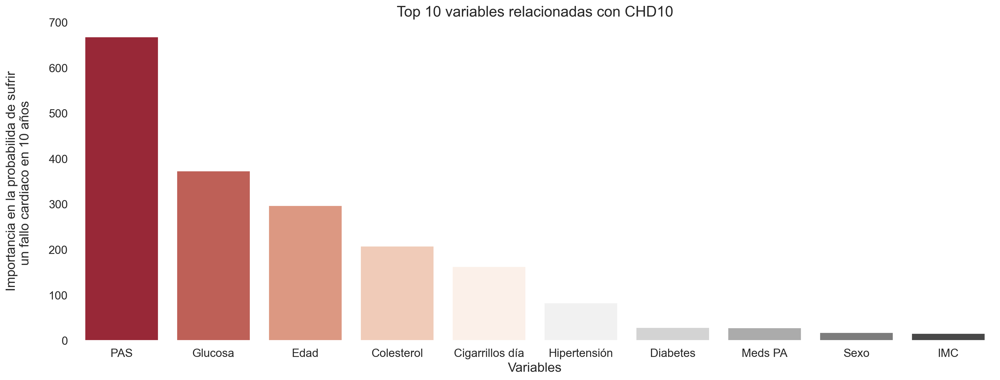

In [28]:
plt.figure(figsize=(20,7)) #Fijamos tamaño del gráfico.
sns.barplot(x='Variable', y='Puntuación', data=top10_variables, palette = "RdGy")
plt.box(False) #Eliminar marco alrededor del gráfico.
plt.title('Top 10 variables relacionadas con CHD10', fontsize=18)
plt.xlabel('Variables', fontsize=16) #Cambiamos el tamaño del título del eje
plt.ylabel('Importancia en la probabilida de sufrir\nun fallo cardiaco en 10 años \n', fontsize=16)
plt.xticks(fontsize=14) #Cambiamos el tamaño de las marcas de los ejes.
plt.yticks(fontsize=14)
plt.show()

Aquellas variables que tienen una mayor relación con la probabilidad de sufrir un fallo cardiaco en 10 años son:
- PAS
- Glucosa
- Edad
- Colesterol
- Cigarrillos día
- Hipertensión
- Diabetes
- Meds PA
- Sexo
- IMC

Con esta selección de variables se crea un nuevo DataFrame que únicamente contiene las 10 variable con mayor relación con nuestra variable final.

In [29]:
data10 = data[['PAS', 'Glucosa', 'Edad', 'Colesterol', 'Cigarrillos día', 'Hipertensión', 'Diabetes', 'Meds PA', 'Sexo', 'IMC', 'CHD10']]

Analizamos la información del nuevo DataFrame.

In [30]:
print(data.shape)
print(data10.shape)

(3653, 15)
(3653, 11)


In [31]:
data10

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Diabetes,Meds PA,Sexo,IMC,CHD10
0,106.0,77.0,39,195.0,0.0,0,0,0.0,1,26.97,0
1,121.0,76.0,46,250.0,0.0,0,0,0.0,0,28.73,0
2,127.5,70.0,48,245.0,20.0,0,0,0.0,1,25.34,0
3,150.0,103.0,61,225.0,30.0,1,0,0.0,0,28.58,1
4,130.0,85.0,46,285.0,23.0,0,0,0.0,0,23.10,0
...,...,...,...,...,...,...,...,...,...,...,...
4231,141.0,81.0,58,187.0,0.0,1,0,0.0,1,24.96,0
4232,168.0,79.0,68,176.0,0.0,1,0,0.0,1,23.14,1
4233,179.0,86.0,50,313.0,1.0,1,0,0.0,1,25.97,1
4234,126.5,68.0,51,207.0,43.0,0,0,0.0,1,19.71,0


In [32]:
data10.describe()

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Diabetes,Meds PA,Sexo,IMC,CHD10
count,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000,3653.000000
mean,132.354777,81.835204,49.560909,236.652341,9.025459,0.311251,0.026827,0.030386,0.443745,25.783444,0.151930
std,22.092762,23.895485,8.562727,43.393581,11.921483,0.463069,0.161600,0.171670,0.496893,4.066770,0.359002
min,83.500000,40.000000,32.000000,113.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.540000,0.000000
25%,117.000000,71.000000,42.000000,206.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.080000,0.000000
50%,128.000000,78.000000,49.000000,234.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.380000,0.000000
75%,143.500000,87.000000,56.000000,263.000000,20.000000,1.000000,0.000000,0.000000,1.000000,28.030000,0.000000
max,295.000000,394.000000,70.000000,439.000000,70.000000,1.000000,1.000000,1.000000,1.000000,56.800000,1.000000


Realizamos de nuevo la correlación siguiendo el mismo método utilizado anteriormente.

<Figure size 1500x1500 with 0 Axes>

<Axes: >

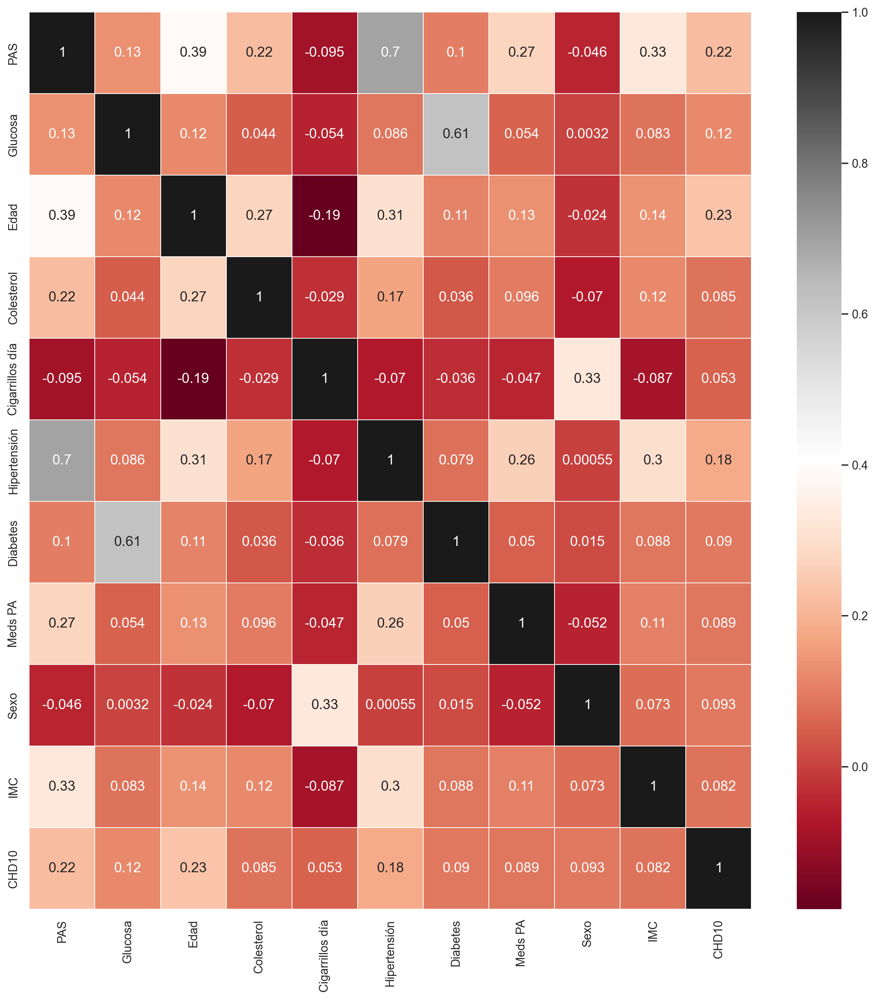

In [33]:
corr_data10 = data10.corr()

plt.figure(figsize=(15,15))
sns.set(font_scale=1)
sns.heatmap(corr_data10, cmap='RdGy', annot=True, linewidths=0.1, annot_kws={"fontsize":13})
plt.show()

Para analizar de una manera más profunda la relación entre cada par de variables del conjunto de datos y entender la correlación entre algunas entidades, se realiza un gráfico de pares. Para cada par de variables, se crea un gráfico que muestra la relación entre esas dos variables. Los gráficos en la diagonal principal muestran la distribución de una sola variable.

En este caso se ha utilizado la función pairplot() de la librería seaborn para crear el gráfico de pares para el DataFrame data10.
Esta función crea un gráfico para cada par de columnas y los organiza en una cuadrícula. Por defecto, se crean gráficos de dispersión para cada par de variables e histogramas para la diagonal principal.

Además, se coloca el argumento hue para colorear los puntos según la variable categórica CHD10.

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


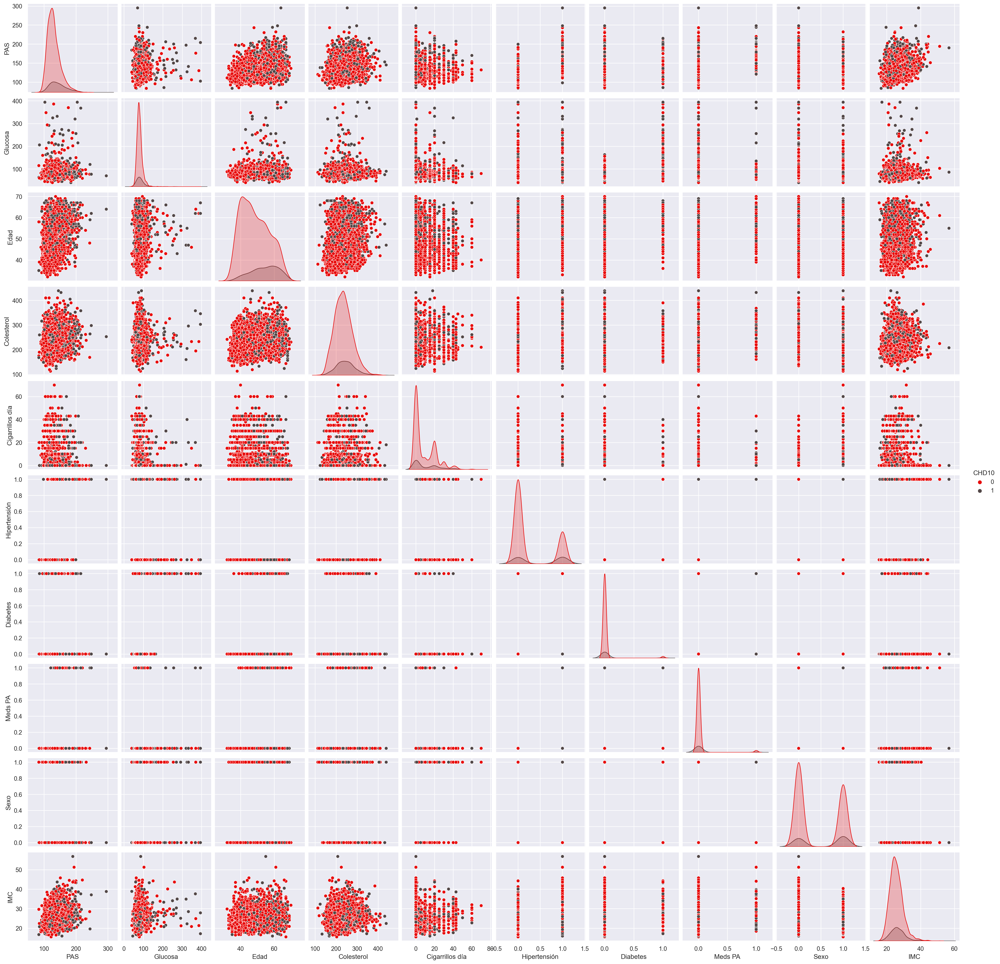

In [34]:
sns.set_palette(["#e80a0a", "#524747"])
sns.pairplot(data10, hue="CHD10")

In [35]:
#Reseteamos el estilo de seaborn.
sns.set_style("ticks")

### Análisis variables categóricas

Analizamos si varía la probabilidad de sufrir una enfermedad cardiaca en función del sexo.

In [36]:
data10["Sexo"].isnull().sum()
data10["Sexo"].unique().tolist()

0

[1, 0]

In [37]:
total_personas = data10["Sexo"].count()
total_hombres = data10["Sexo"].value_counts()[1]
total_mujeres = data10["Sexo"].value_counts()[0]

print("El total de personas es de:", total_personas)
print("De los cuales", total_hombres, "son hombres y", total_mujeres, "son mujeres.")

El total de personas es de: 3653
De los cuales 1621 son hombres y 2032 son mujeres.


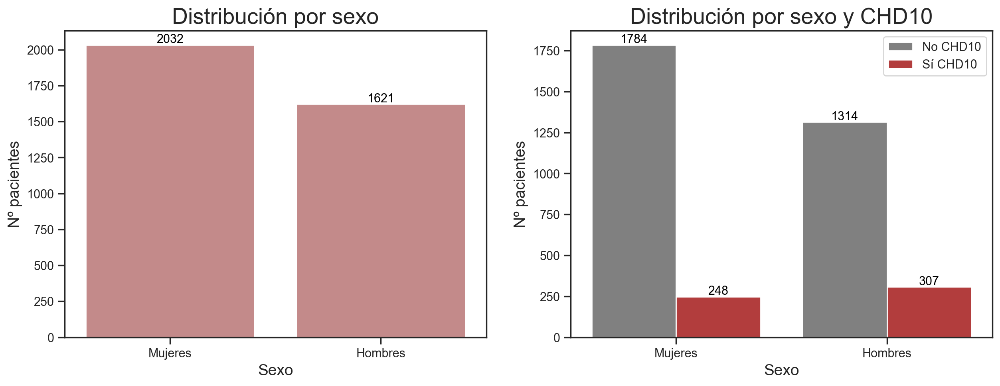

In [38]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data10['Sexo'], ax=ax1, color='#cc8181')
sns.countplot(x = data10['Sexo'], hue=data10['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por sexo', fontsize=20)
ax2.set_title('Distribución por sexo y CHD10', fontsize=20)

ax1.set_xlabel('Sexo', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Sexo', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['Mujeres', 'Hombres'])
ax2.set_xticklabels(['Mujeres', 'Hombres'])

ax2.legend(['No CHD10', 'Sí CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [40]:
print("Probabilidad mujeres NO CHD10 =", round((1784*100)/2032, 2), "%")
print("Probabilidad mujeres SÍ CHD10 =", round((248*100)/2032, 2), "%")

print("Probabilidad hombres NO CHD10 =", round((1314*100)/1621, 2), "%")
print("Probabilidad hombres SÍ CHD10 =", round((307*100)/1621, 2), "%")

Probabilidad mujeres NO CHD10 = 87.8 %
Probabilidad mujeres SÍ CHD10 = 12.2 %
Probabilidad hombres NO CHD10 = 81.06 %
Probabilidad hombres SÍ CHD10 = 18.94 %


Se ha recogido información de 3653 personas, de las cuales 1621 son hombres y 2032 mujeres. 
En la segunda gráfica se observa que el porcentaje de sufrir una enfermedad cardiaca es menor para mujeres que para hombres.

0- Mujeres: 87,80% de NO sufrir una enfermedad cardiaca y un 12,20% de sufrirla.

1- Hombres: 81,06% de NO sufrir una enfermedad cardiaca y un 18,94% de sufrirla.

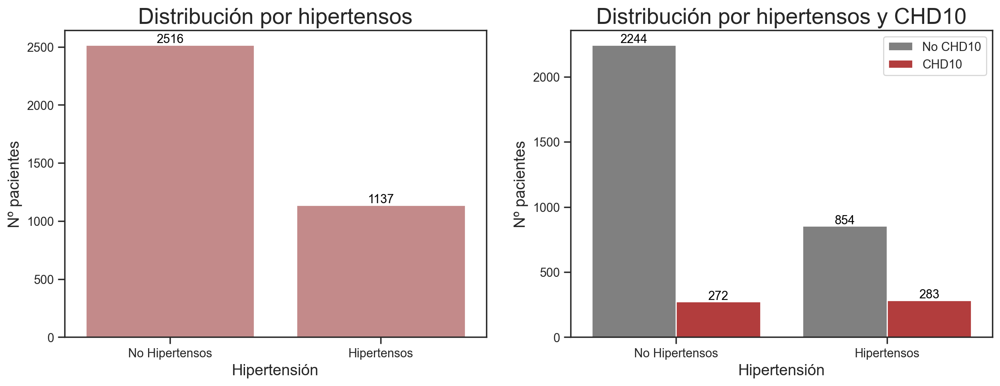

In [41]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data10['Hipertensión'], ax=ax1, color='#cc8181')
sns.countplot(x = data10['Hipertensión'], hue=data10['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por hipertensos', fontsize=20)
ax2.set_title('Distribución por hipertensos y CHD10', fontsize=20)

ax1.set_xlabel('Hipertensión', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Hipertensión', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No Hipertensos', 'Hipertensos'])
ax2.set_xticklabels(['No Hipertensos', 'Hipertensos'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [42]:
print("Probabilidad no hipertensos NO CHD10 =", round((2244*100)/2516, 2), "%")
print("Probabilidad no hipertensos SÍ CHD10 =", round((272*100)/2516, 2), "%")

print("Probabilidad hipertensos NO CHD10 =", round((854*100)/1137, 2), "%")
print("Probabilidad hipertensos SÍ CHD10 =", round((283*100)/1137, 2), "%")

Probabilidad no hipertensos NO CHD10 = 89.19 %
Probabilidad no hipertensos SÍ CHD10 = 10.81 %
Probabilidad hipertensos NO CHD10 = 75.11 %
Probabilidad hipertensos SÍ CHD10 = 24.89 %


En la segunda gráfica anterior se observa que el porcentaje de sufrir una enfermedad cardiaca es mayor si el paciente es hipertenso.

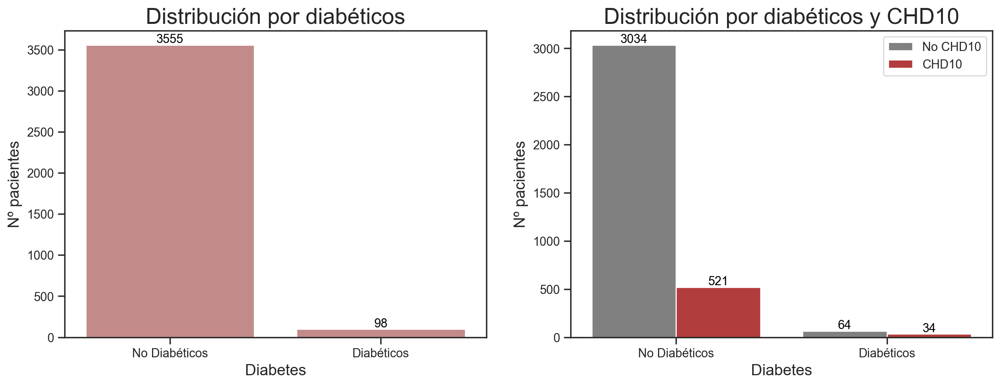

In [43]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data10['Diabetes'], ax=ax1, color='#cc8181')
sns.countplot(x = data10['Diabetes'], hue=data10['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por diabéticos', fontsize=20)
ax2.set_title('Distribución por diabéticos y CHD10', fontsize=20)

ax1.set_xlabel('Diabetes', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Diabetes', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No Diabéticos', 'Diabéticos'])
ax2.set_xticklabels(['No Diabéticos', 'Diabéticos'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [44]:
print("Probabilidad no diabéticos NO CHD10 =", round((3034*100)/3555, 2), "%")
print("Probabilidad no diabéticos SÍ CHD10 =", round((521*100)/3555, 2), "%")

print("Probabilidad diabéticos NO CHD10 =", round((64*100)/98, 2), "%")
print("Probabilidad diabéticos SÍ CHD10 =", round((34*100)/98, 2), "%")

Probabilidad no diabéticos NO CHD10 = 85.34 %
Probabilidad no diabéticos SÍ CHD10 = 14.66 %
Probabilidad diabéticos NO CHD10 = 65.31 %
Probabilidad diabéticos SÍ CHD10 = 34.69 %


De la gráfica anterior se puede concluir que la probabilidad de sufrir un CHD10 es mayor que el doble para los pacientes diabéticos en comparación con los no diabéticos.

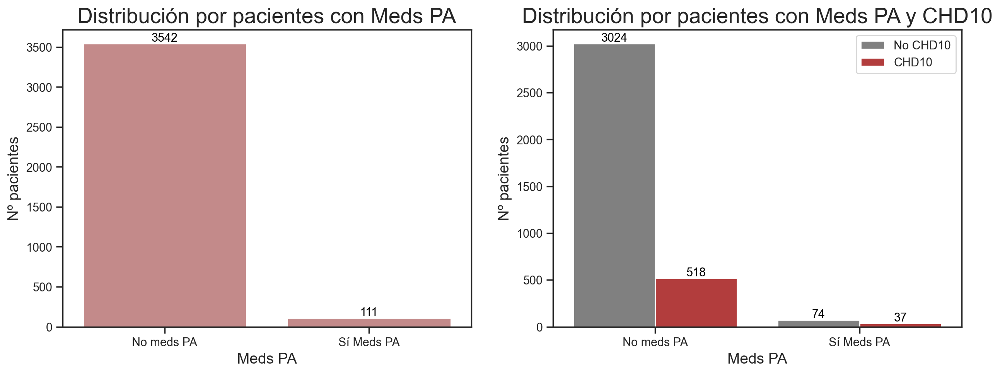

In [45]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.countplot(x = data10['Meds PA'], ax=ax1, color='#cc8181')
sns.countplot(x = data10['Meds PA'], hue=data10['CHD10'], ax=ax2, palette=["gray", "#c52929"])

ax1.set_title('Distribución por pacientes con Meds PA', fontsize=20)
ax2.set_title('Distribución por pacientes con Meds PA y CHD10', fontsize=20)

ax1.set_xlabel('Meds PA', fontsize=14)
ax1.set_ylabel('Nº pacientes', fontsize=14)
ax2.set_xlabel('Meds PA', fontsize=14)
ax2.set_ylabel('Nº pacientes', fontsize=14)

ax1.set_xticklabels(['No meds PA', 'Sí Meds PA'])
ax2.set_xticklabels(['No meds PA', 'Sí Meds PA'])

ax2.legend(['No CHD10', 'CHD10'])

for p in ax1.patches:
    ax1.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

for p in ax2.patches:
    ax2.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show();

In [46]:
print("Probabilidad pacientes sin Meds PA y NO CHD10 =", round((3024*100)/3542, 2), "%")
print("Probabilidad pacientes sin Meds PA y SÍ CHD10 =", round((518*100)/3542, 2), "%")

print("Probabilidad pacientes con Meds PA y NO CHD10 =", round((74*100)/111, 2), "%")
print("Probabilidad pacientes con Meds PA y SÍ CHD10 =", round((37*100)/111, 2), "%")

Probabilidad pacientes sin Meds PA y NO CHD10 = 85.38 %
Probabilidad pacientes sin Meds PA y SÍ CHD10 = 14.62 %
Probabilidad pacientes con Meds PA y NO CHD10 = 66.67 %
Probabilidad pacientes con Meds PA y SÍ CHD10 = 33.33 %


De la gráfica anterior se observa que aquellos pacientes que tienen una presión arterial elevada tienen mayor probabilidad de sufrir un CHD10 aún tomando medicación.

## Analizamos variables numéricas

El gráfico de caja (boxplot) muestra la distribución de los datos a través de sus cuartiles. La línea central representa la mediana, el cuadro representa el rango intercuartil (IQR) y las líneas verticales (bigotes) representan los valores mínimo y máximo dentro de 1.5 veces el IQR. Los puntos fuera de los bigotes se consideran valores atípicos12.

El gráfico de enjambre (swarmplot) muestra cada punto de datos individual en una distribución. Este tipo de gráfico muestra la distribución de los datos en una variable categórica y una variable numérica. En este caso, el eje x representa la variable categórica ‘CHD10’ y el eje y representa para cada gráfico una de las variables numéricas de estudio. La función swarmplot() se utiliza para visualizar los datos de manera más clara y evitar que se superpongan.

El gráfico de violín (violinplot) es similar al gráfico de caja, pero muestra la distribución completa de los datos. La forma del violín representa la densidad estimada de los datos y la línea central representa la mediana

<Axes: xlabel='CHD10', ylabel='Edad'>

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\1023811391.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Edad', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 42.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='CHD10', ylabel='Edad'>

<Axes: xlabel='CHD10', ylabel='Edad'>

Text(0.5, 0.98, 'Distribución por edad')

[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\1023811391.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])


[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

[Text(0, 0, 'No CHD10'), Text(1, 0, 'CHD10')]

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 66.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


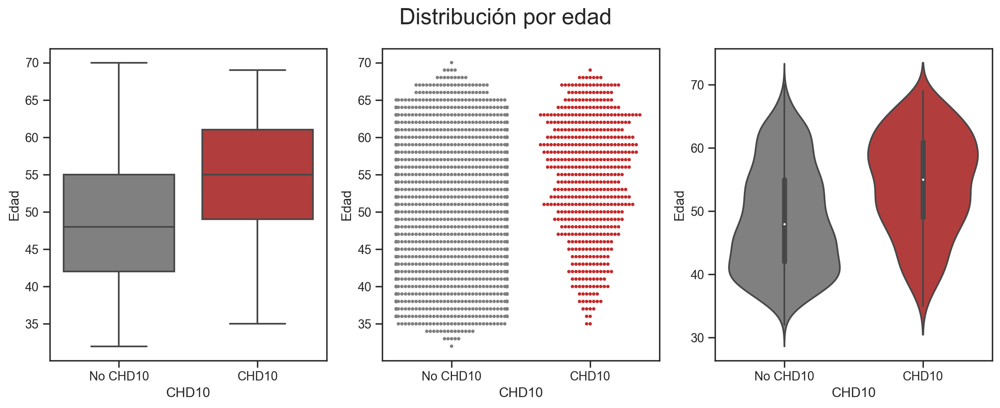

In [47]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Edad', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Edad', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Edad', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por edad', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show()

De los gráficos anteriores se observa que la mayoría de los pacientes de edad alrededor de 40-50 tienen un riesgo menor de sufrir una enfermedad cardiaca, mientras que el riesgo aumenta a partir de los 50 años.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\370635325.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='PAS', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 47.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\370635325.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 65.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


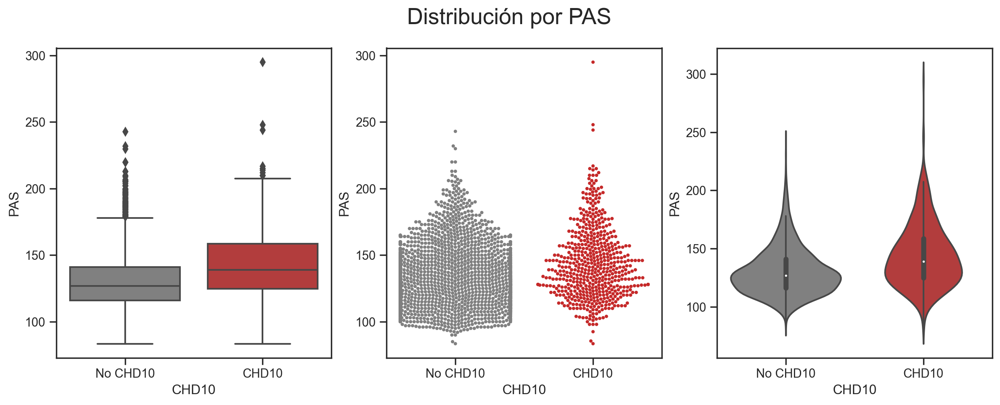

In [48]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='PAS', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='PAS', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='PAS', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por PAS', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De los gráficos anteriores se observa que el riesgo de sufrir un CHD10 aumenta a PAS más elevadas.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\3718382980.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='IMC', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 43.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\3718382980.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 63.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


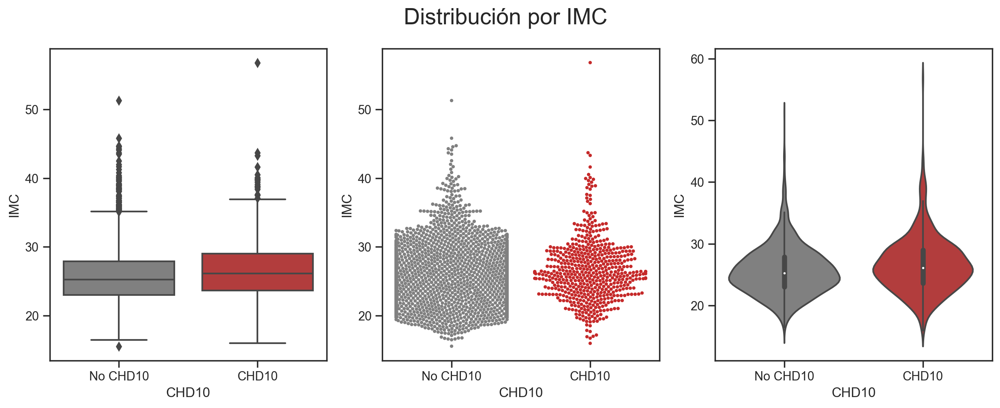

In [49]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='IMC', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='IMC', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='IMC', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por IMC', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])


plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación con el IMC del paciente.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\4240769177.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Glucosa', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 72.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\4240769177.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seabo

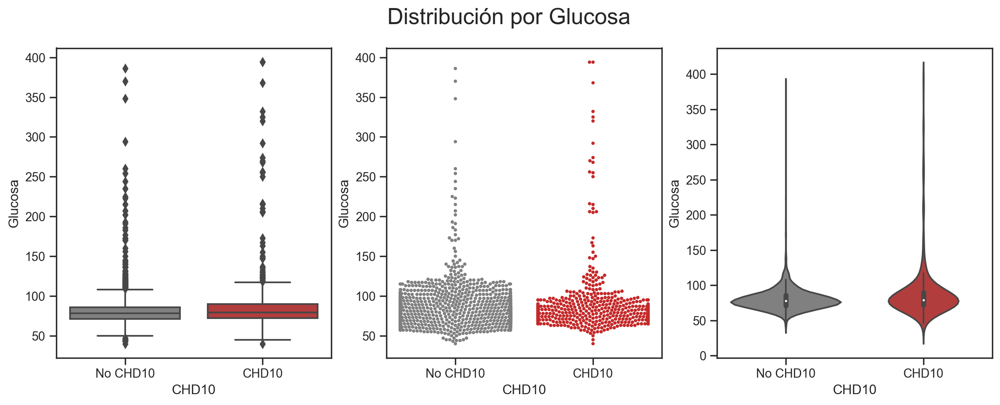

In [50]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Glucosa', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Glucosa', data=data10, ax=ax2, size=3, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Glucosa', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Glucosa', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación con la variable glucosa.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\4294358895.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Colesterol', data=data10, ax=ax2, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 65.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\4294358895.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 79.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\ca

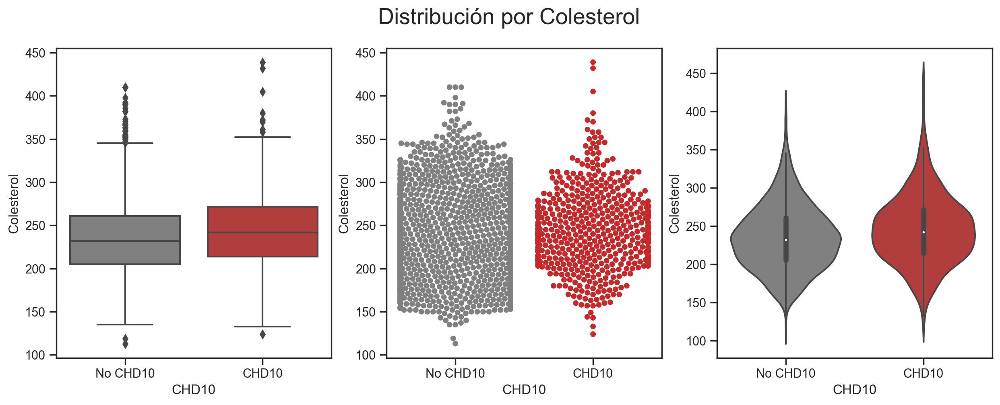

In [51]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Colesterol', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Colesterol', data=data10, ax=ax2, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Colesterol', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Colesterol', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación a la variable colesterol.

C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\759742239.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax2, palette=["gray", "#c52929"])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 86.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 56.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Cristina\AppData\Local\Temp\ipykernel_7836\759742239.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['No CHD10', 'CHD10'])
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\seaborn

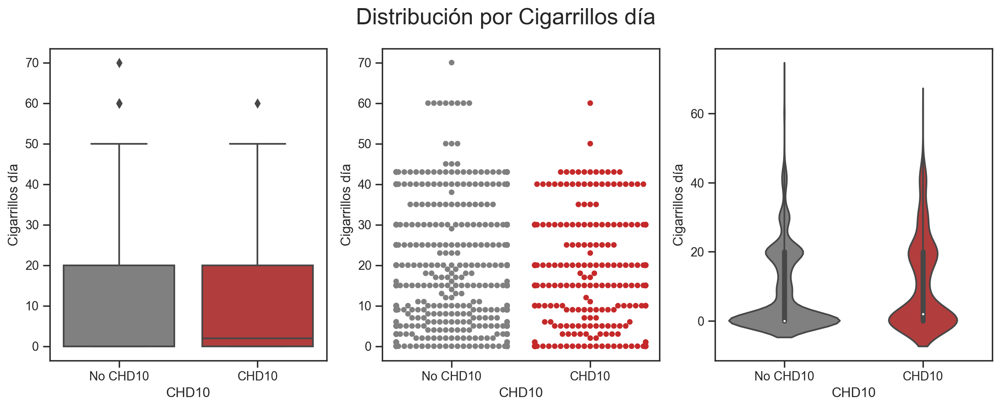

In [52]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(15,5))

fig.patch.set_facecolor('white')
ax1.grid(False)
ax2.grid(False)

sns.boxplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax1, palette=["gray", "#c52929"])
sns.swarmplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax2, palette=["gray", "#c52929"])
sns.violinplot(x='CHD10', y='Cigarrillos día', data=data10, ax=ax3, palette=["gray", "#c52929"])

fig.suptitle('Distribución por Cigarrillos día', fontsize=20)

ax1.set_xticklabels(['No CHD10', 'CHD10'])
ax2.set_xticklabels(['No CHD10', 'CHD10'])
ax3.set_xticklabels(['No CHD10', 'CHD10'])

plt.show();

De las gráficas anteriores se puede observar que no hay una dieferencia significativa con respecto a sufrir un CHD10 en relación la cantidad del cigarrillos que consume el paciente al día.

# Machine Learning

In [53]:
data10

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Diabetes,Meds PA,Sexo,IMC,CHD10
0,106.0,77.0,39,195.0,0.0,0,0,0.0,1,26.97,0
1,121.0,76.0,46,250.0,0.0,0,0,0.0,0,28.73,0
2,127.5,70.0,48,245.0,20.0,0,0,0.0,1,25.34,0
3,150.0,103.0,61,225.0,30.0,1,0,0.0,0,28.58,1
4,130.0,85.0,46,285.0,23.0,0,0,0.0,0,23.10,0
...,...,...,...,...,...,...,...,...,...,...,...
4231,141.0,81.0,58,187.0,0.0,1,0,0.0,1,24.96,0
4232,168.0,79.0,68,176.0,0.0,1,0,0.0,1,23.14,1
4233,179.0,86.0,50,313.0,1.0,1,0,0.0,1,25.97,1
4234,126.5,68.0,51,207.0,43.0,0,0,0.0,1,19.71,0


Preparamos X e y junto con el conjunto de entrenamiento.

In [54]:
X = data10.iloc[:,0:-1]  #variables dependientes
y = data10.iloc[:,-1]    #variables independientes = CHD10
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)

Antes de aplicar los modelos de machine learning, debemos verificar si los datos están distribuidos de manera equitativa o no, ya que si los datos están desbalanceados pueden obtenerse resultados poco satisfactorios.

In [74]:
conteo_valores = data10['CHD10'].value_counts()
print(conteo_valores)

CHD10
0    3098
1     555
Name: count, dtype: int64


In [75]:
print(y_test.unique())

[0 1]


In [76]:
frecuencias = {}
for elemento in y_test:
    if elemento in frecuencias:
        frecuencias[elemento] += 1
    else:
        frecuencias[elemento] = 1

print(frecuencias)

{0: 613, 1: 118}


Se observa que el conjunto de datos está desequilibrado, donde el número de muestras para una clase (personas que no padecen la enfermedad) es mucho mayor que el número de muestras para la otra clase(personas que padecen la enfermedad). Esto puede dificultar que los modelos de aprendizaje automático predigan con precisión la clase minoritaria.

Vamos a aplicar los distintos modelos de ML con estos datos, sin tratar, siendo conscientes de que lo más probable es que los resultados no sean muy favorables.

### Escala de características
Escalamos nuestras variables utilizando para ello el método Standard Scaler.

In [57]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# **ML models**

Estos son los algoritmos que se van a emplear en este proyecto:

1. Logistic Regression
2. Naive Bayes
3. Random Forest Classifier
4. Extreme Gradient Boost
5. Gradient Boosting Classifier
6. Ada Boost Classifier
7. K-Nearest Neighbour
8. Decision Tree Classifier
9. Support Vector Machine
10. Neural Network MLP Classifier
11. Stacking CV Classifier

In [58]:
# data modeling
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
#ensembling
from mlxtend.classifier import StackingCVClassifier

El algoritmo Logistic Regression es un modelo estadístico que se utiliza para estimar la probabilidadades en función de un conjunto de variables. En el análisis de regresión, la regresión logística es la estimación de los parámetros de un modelo logístico (los coeficientes en la combinación lineal).

In [59]:
LR_ = 'Logistic Regression'
lr = LogisticRegression()
model = lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)
print("confussion matrix")
print(lr_conf_matrix)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score,'\n')
print(classification_report(y_test,lr_predict))

confussion matrix
[[606   7]
 [112   6]]


Accuracy of Logistic Regression: 0.8372093023255814 

              precision    recall  f1-score   support

           0       0.84      0.99      0.91       613
           1       0.46      0.05      0.09       118

    accuracy                           0.84       731
   macro avg       0.65      0.52      0.50       731
weighted avg       0.78      0.84      0.78       731



Naive Bayes es un algoritmo de aprendizaje supervisado que se utiliza para tareas de clasificación. Todos los clasificadores Naive Bayes asumen que el valor de una característica en particular es independiente del valor de cualquier otra característica, dada la variable de clase.

In [60]:
NB_ = 'Naive Bayes'
nb = GaussianNB()
nb.fit(X_train, y_train)
nbpred = nb.predict(X_test)
nb_conf_matrix = confusion_matrix(y_test, nbpred)
nb_acc_score = accuracy_score(y_test, nbpred)
print("confussion matrix")
print(nb_conf_matrix)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score*100,'\n')
print(classification_report(y_test,nbpred))

GaussianNB()

confussion matrix
[[570  43]
 [ 92  26]]


Accuracy of Naive Bayes model: 81.53214774281807 

              precision    recall  f1-score   support

           0       0.86      0.93      0.89       613
           1       0.38      0.22      0.28       118

    accuracy                           0.82       731
   macro avg       0.62      0.58      0.59       731
weighted avg       0.78      0.82      0.79       731



Random Forest Classifier es un método de aprendizaje en conjunto para la clasificación, regresión y otras tareas que opera construyendo una multitud de árboles de decisión en el momento del entrenamiento.

In [61]:
RFC_ = 'Random Forest Classfier'
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
rfc_predicted = rfc.predict(X_test)
rfc_conf_matrix = confusion_matrix(y_test, rfc_predicted)
rfc_acc_score = accuracy_score(y_test, rfc_predicted)
print("confussion matrix")
print(rfc_conf_matrix)
print("\n")
print("Accuracy of Random Forest:",rfc_acc_score*100,'\n')
print(classification_report(y_test,rfc_predicted))

RandomForestClassifier()

confussion matrix
[[600  13]
 [112   6]]


Accuracy of Random Forest: 82.9001367989056 

              precision    recall  f1-score   support

           0       0.84      0.98      0.91       613
           1       0.32      0.05      0.09       118

    accuracy                           0.83       731
   macro avg       0.58      0.51      0.50       731
weighted avg       0.76      0.83      0.77       731



XGBoost es una implementación escalable y altamente precisa del aumento de gradiente que lleva al límite el poder de cómputo para los algoritmos de árboles aumentados, siendo construido en gran medida para energizar el rendimiento y la velocidad computacional del modelo de aprendizaje automático. Con XGBoost, los árboles se construyen en paralelo, en lugar de secuencialmente.

In [62]:
XGB_ = 'Extreme Gradient Boost'
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
xgb_predicted = xgb.predict(X_test)
xgb_conf_matrix = confusion_matrix(y_test, xgb_predicted)
xgb_acc_score = accuracy_score(y_test, xgb_predicted)
print("confussion matrix")
print(xgb_conf_matrix)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score*100,'\n')
print(classification_report(y_test,xgb_predicted))

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

confussion matrix
[[579  34]
 [101  17]]


Accuracy of Extreme Gradient Boost: 81.53214774281807 

              precision    recall  f1-score   support

           0       0.85      0.94      0.90       613
           1       0.33      0.14      0.20       118

    accuracy                           0.82       731
   macro avg       0.59      0.54      0.55       731
weighted avg       0.77      0.82      0.78       731



Gradient Boosting Classifier es un algoritmo de aprendizaje automático para problemas de clasificación y regresión. Esta técnica construye el modelo en etapas y generaliza el modelo permitiendo la optimización de una función de pérdida diferenciable arbitraria. El objetivo del Gradient Boosting es minimizar la función de pérdida mediante la adición iterativa de modelos débiles, cada uno corrigiendo los errores cometidos por el modelo anterior en el conjunto. Esto se logra ajustando un nuevo modelo para predecir los residuos (errores) del modelo anterior, y luego sumando este nuevo modelo al modelo existente para mejorar la precisión.

In [63]:
GBC_ = 'GradientBoostingClassifier'
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)
gbc_predicted = gbc.predict(X_test)
gbc_conf_matrix = confusion_matrix(y_test, gbc_predicted)
gbc_acc_score = accuracy_score(y_test, gbc_predicted)
print("confussion matrix")
print(gbc_conf_matrix)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",gbc_acc_score*100,'\n')
print(classification_report(y_test,gbc_predicted))

GradientBoostingClassifier()

confussion matrix
[[594  19]
 [110   8]]


Accuracy of Gradient Boosting Classifier: 82.35294117647058 

              precision    recall  f1-score   support

           0       0.84      0.97      0.90       613
           1       0.30      0.07      0.11       118

    accuracy                           0.82       731
   macro avg       0.57      0.52      0.51       731
weighted avg       0.76      0.82      0.77       731



AdaBoost es un algoritmo iterativo que ajusta los pesos de las observaciones en cada iteración. En cada iteración, se ajusta un nuevo clasificador para predecir las etiquetas de clase de las observaciones. Después de cada iteración, se actualizan los pesos de las observaciones mal clasificadas para que el siguiente clasificador se centre más en ellas. Este proceso se repite hasta que se alcanza el número máximo de iteraciones o hasta que no se puede mejorar más el rendimiento del modelo.

In [67]:
ADA_ = 'AdaBoostClassifier'
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
ada_predicted = ada.predict(X_test)
ada_conf_matrix = confusion_matrix(y_test, ada_predicted)
ada_acc_score = accuracy_score(y_test, ada_predicted)
print("confussion matrix")
print(ada_conf_matrix)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",ada_acc_score*100,'\n')
print(classification_report(y_test,ada_predicted))

AdaBoostClassifier()

confussion matrix
[[598  15]
 [113   5]]


Accuracy of Gradient Boosting Classifier: 82.48974008207935 

              precision    recall  f1-score   support

           0       0.84      0.98      0.90       613
           1       0.25      0.04      0.07       118

    accuracy                           0.82       731
   macro avg       0.55      0.51      0.49       731
weighted avg       0.75      0.82      0.77       731



El algoritmo KNN funciona encontrando los k puntos más cercanos (vecinos) a un punto de datos de prueba y asignándole la clase más común entre esos vecinos. La distancia entre los puntos se puede medir utilizando diferentes métricas, como la distancia euclidiana o la distancia de Manhattan. El número de vecinos k es un parámetro que se puede ajustar para mejorar el rendimiento del modelo.

In [68]:
KNN_ = 'K-NeighborsClassifier'
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
knn_predicted = knn.predict(X_test)
knn_conf_matrix = confusion_matrix(y_test, knn_predicted)
knn_acc_score = accuracy_score(y_test, knn_predicted)
print("confussion matrix")
print(knn_conf_matrix)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score*100,'\n')
print(classification_report(y_test,knn_predicted))

KNeighborsClassifier()

confussion matrix
[[595  18]
 [106  12]]


Accuracy of K-NeighborsClassifier: 83.03693570451436 

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       613
           1       0.40      0.10      0.16       118

    accuracy                           0.83       731
   macro avg       0.62      0.54      0.53       731
weighted avg       0.78      0.83      0.79       731



Un árbol de decisión es un enfoque supervisado utilizado en estadísticas, minería de datos y aprendizaje automático. En este formalismo, se utiliza un árbol de decisión o clasificación como modelo predictivo para sacar conclusiones sobre un conjunto de observaciones. Los modelos arbóreos donde la variable objetivo puede tomar un conjunto discreto de valores se llaman árboles de clasificación; en estas estructuras arbóreas, las hojas representan etiquetas de clase y las ramas representan conjunciones de características que conducen a esas etiquetas de clase.

Un árbol de decisión se construye mediante la división recursiva del conjunto de datos en subconjuntos más pequeños basados en pruebas sobre las características. Cada nodo interno del árbol representa una prueba sobre una característica y cada rama representa el resultado de esa prueba. Las hojas del árbol representan las etiquetas de clase y el camino desde la raíz hasta una hoja representa una secuencia de pruebas que conducen a esa etiqueta.

In [69]:
DTC_ = 'DecisionTreeClassifier'
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc_predicted = dtc.predict(X_test)
dtc_conf_matrix = confusion_matrix(y_test, dtc_predicted)
dtc_acc_score = accuracy_score(y_test, dtc_predicted)
print("confussion matrix")
print(dtc_conf_matrix)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dtc_acc_score*100,'\n')
print(classification_report(y_test,dtc_predicted))

DecisionTreeClassifier()

confussion matrix
[[520  93]
 [ 94  24]]


Accuracy of DecisionTreeClassifier: 74.4186046511628 

              precision    recall  f1-score   support

           0       0.85      0.85      0.85       613
           1       0.21      0.20      0.20       118

    accuracy                           0.74       731
   macro avg       0.53      0.53      0.53       731
weighted avg       0.74      0.74      0.74       731



El modelo Support Vector Machine Classifier con kernel RBF tiene dos hiperparámetros principales: C y gamma. El hiperparámetro C controla el equilibrio entre la maximización del margen y la minimización del error de clasificación. Un valor pequeño de C da más importancia a la maximización del margen, mientras que un valor grande de C da más importancia a la minimización del error de clasificación. El hiperparámetro gamma controla la forma de la función de base radial y, por lo tanto, el grado de flexibilidad del modelo. Un valor pequeño de gamma da lugar a un modelo más flexible, mientras que un valor grande de gamma da lugar a un modelo más rígido.

In [70]:
SVC_ = 'Support Vector Machine Classifier'
svc =  SVC(kernel='rbf', C=1000, gamma=0.1)
svc.fit(X_train, y_train)
svc_predicted = svc.predict(X_test)
svc_conf_matrix = confusion_matrix(y_test, svc_predicted)
svc_acc_score = accuracy_score(y_test, svc_predicted)
print("confussion matrix")
print(svc_conf_matrix)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score*100,'\n')
print(classification_report(y_test,svc_predicted))

SVC(C=1000, gamma=0.1)

confussion matrix
[[560  53]
 [ 95  23]]


Accuracy of Support Vector Classifier: 79.75376196990423 

              precision    recall  f1-score   support

           0       0.85      0.91      0.88       613
           1       0.30      0.19      0.24       118

    accuracy                           0.80       731
   macro avg       0.58      0.55      0.56       731
weighted avg       0.77      0.80      0.78       731



El siguiente método empleado es un modelo de red neuronal utilizando la clase MLPClassifier. MLP significa “Perceptrón Multicapa” y se refiere a una arquitectura específica de red neuronal que consta de múltiples capas de nodos o neuronas. Estos modelos son capaces de aprender relaciones no lineales entre las características de entrada y las clases de salida, lo que los hace adecuados para una amplia variedad de problemas de clasificación.

Este modelo de aprendizaje automático para clasificación puede aprender relaciones no lineales entre las características y las clases.

In [71]:
MLPC_ = 'Neural Network MLPClassifier'
mlpc =  MLPClassifier()
mlpc.fit(X_train, y_train)
mlpc_predicted = mlpc.predict(X_test)
mlpc_conf_matrix = confusion_matrix(y_test, mlpc_predicted)
mlpc_acc_score = accuracy_score(y_test, mlpc_predicted)
print("confussion matrix")
print(mlpc_conf_matrix)
print("\n")
print("Accuracy of Support Vector Classifier:",mlpc_acc_score*100,'\n')
print(classification_report(y_test,mlpc_predicted))


c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

confussion matrix
[[602  11]
 [107  11]]


Accuracy of Support Vector Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       613
           1       0.50      0.09      0.16       118

    accuracy                           0.84       731
   macro avg       0.67      0.54      0.53       731
weighted avg       0.79      0.84      0.79       731



Para intentar mejorar los resultados obtenidos se aplica también un modelo de ensembling. En este caso, se utiliza la técnica de stacking.

El Stacking CV Classifier es un meta-clasificador de aprendizaje en conjunto para apilar múltiples modelos de clasificación. El stacking (apilamiento) es una técnica de aprendizaje en conjunto que combina múltiples modelos de clasificación o regresión para mejorar la precisión predictiva. En lugar de hacer una predicción directa, los modelos base son entrenados para hacer predicciones que luego son utilizadas como características de entrada para un segundo nivel de modelo, llamado meta-modelo, que hace la predicción final. Esto ayuda a prevenir el sobreajuste y mejora la precisión predictiva del modelo final.

In [72]:
scv=StackingCVClassifier(classifiers=[xgb,knn,svc],meta_classifier= svc,random_state=42)
scv.fit(X_train,y_train)
scv_predicted = scv.predict(X_test)
scv_conf_matrix = confusion_matrix(y_test, scv_predicted)
scv_acc_score = accuracy_score(y_test, scv_predicted)
print("confussion matrix")
print(scv_conf_matrix)
print("\n")
print("Accuracy of StackingCVClassifier:",scv_acc_score*100,'\n')
print(classification_report(y_test,scv_predicted))

StackingCVClassifier(classifiers=[XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None, gamma=None,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate...
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                n_estimators=100, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None, ...),
                                  KNeighborsClassifier(),
                                  SVC(C=1000, gamma=0.1)],
                     meta_classifier=SVC(C=1000, gamma=0.1), random_state=42)

confussion matrix
[[613   0]
 [117   1]]


Accuracy of StackingCVClassifier: 83.99452804377565 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       1.00      0.01      0.02       118

    accuracy                           0.84       731
   macro avg       0.92      0.50      0.46       731
weighted avg       0.87      0.84      0.77       731



### Resultados de los distintos métodos de ML

In [93]:
# Create an empty DataFrame to store the confusion matrices and accuracy scores
conf_matrices = pd.DataFrame(columns=['Model', 'Confusion Matrix', 'Accuracy'])

# Add the confusion matrix and accuracy score for the Logistic Regression model
new_row = pd.DataFrame({'Model': ['Logistic Regression'],
                        'Confusion Matrix': [lr_conf_matrix],
                        'Accuracy': [lr_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Naive Bayes model
new_row = pd.DataFrame({'Model': ['Naive Bayes'],
                        'Confusion Matrix': [nb_conf_matrix],
                        'Accuracy': [nb_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Random Forest Classifier model
new_row = pd.DataFrame({'Model': ['Random Forest Classifier'],
                        'Confusion Matrix': [rfc_conf_matrix],
                        'Accuracy': [rfc_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Extreme Gradient Boost model
new_row = pd.DataFrame({'Model': ['Extreme Gradient Boost'],
                        'Confusion Matrix': [xgb_conf_matrix],
                        'Accuracy': [xgb_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Gradient Boosting Classifier model
new_row = pd.DataFrame({'Model': ['Gradient Boosting Classifier'],
                        'Confusion Matrix': [gbc_conf_matrix],
                        'Accuracy': [gbc_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the AdaBoost Classifier model
new_row = pd.DataFrame({'Model': ['AdaBoost Classifier'],
                        'Confusion Matrix': [ada_conf_matrix],
                        'Accuracy': [ada_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the K-Neighbors Classifier model
new_row = pd.DataFrame({'Model': ['K-Neighbors Classifier'],
                        'Confusion Matrix': [knn_conf_matrix],
                        'Accuracy': [knn_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Decision Tree Classifier model
new_row = pd.DataFrame({'Model': ['Decision Tree Classifier'],
                        'Confusion Matrix': [dtc_conf_matrix],
                        'Accuracy': [dtc_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Support Vector Machine Classifier model
new_row = pd.DataFrame({'Model': ['Support Vector Machine Classifier'],
                        'Confusion Matrix': [svc_conf_matrix],
                        'Accuracy': [svc_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the Neural Network MLPClassifier model
new_row = pd.DataFrame({'Model': ['Neural Network MLPClassifier'],
                        'Confusion Matrix': [mlpc_conf_matrix],
                        'Accuracy': [mlpc_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Add the confusion matrix and accuracy score for the StackingCVClassifier model
new_row = pd.DataFrame({'Model': ['StackingCVClassifier'],
                        'Confusion Matrix': [scv_conf_matrix],
                        'Accuracy':[scv_acc_score]})
conf_matrices = pd.concat([conf_matrices, new_row], ignore_index=True)

# Print the resulting table
print(conf_matrices)

                                Model        Confusion Matrix  Accuracy
0                 Logistic Regression    [[606, 7], [112, 6]]  0.837209
1                         Naive Bayes   [[570, 43], [92, 26]]  0.815321
2            Random Forest Classifier   [[600, 13], [112, 6]]  0.829001
3              Extreme Gradient Boost  [[579, 34], [101, 17]]  0.815321
4        Gradient Boosting Classifier   [[594, 19], [110, 8]]  0.823529
5                 AdaBoost Classifier   [[598, 15], [113, 5]]  0.824897
6              K-Neighbors Classifier  [[595, 18], [106, 12]]  0.830369
7            Decision Tree Classifier   [[520, 93], [94, 24]]  0.744186
8   Support Vector Machine Classifier   [[560, 53], [95, 23]]  0.797538
9        Neural Network MLPClassifier  [[602, 11], [107, 11]]  0.838577
10               StackingCVClassifier    [[613, 0], [117, 1]]  0.839945


Como esperabamos los resultados no son muy aceptables ya que apenas predicen los verdaderos positivos, es decir, la gente que ha sufrido una enfermedad cardiaca. Sí es cierto que el valor de accuracy para la mayoría de modelos es bastante bueno pero para este proyecto este valor no tiene tanta importancia como predecir con exactitud si se va a sufrir una enfermedad cardiaca.

Por ello, se procede a usar técnicas que equilibren los datos con la intención de mejorar la predicción.
En este proyecto vamos a usar 3 técnicas: smote, random oversamping y random undersamping.

## SMOTE

SMOTE (Synthetic Minority Over-sampling Technique) es una técnica de sobremuestreo que funciona de manera diferente al sobremuestreo típico. En lugar de simplemente duplicar los datos minoritarios, SMOTE utiliza un algoritmo de vecino k-más cercano para crear datos sintéticos. SMOTE comienza eligiendo datos aleatorios de la clase minoritaria, luego establece los k vecinos más cercanos de los datos. Los datos sintéticos se crean entonces entre los datos aleatorios y el vecino k más cercano seleccionado al azar.

In [77]:
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [78]:
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X, y)

In [79]:
print(len(X))
print(len(y))
print(len(X_smote))
print(len(y_smote))

3653
3653
6196
6196


Se procede exactamente igual que en el apartado anterior (sin tratar los datos).

In [80]:
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size=0.20, random_state = 42)

In [81]:
scaler = StandardScaler()
X_train_smote = scaler.fit_transform(X_train_smote)
X_test_smote = scaler.transform(X_test_smote)

In [82]:
LR_smote = 'Logistic Regression'
lr_smote = LogisticRegression()
model = lr_smote.fit(X_train_smote, y_train_smote)
lr_predict_smote = lr_smote.predict(X_test)
lr_conf_matrix_smote = confusion_matrix(y_test, lr_predict_smote)
lr_acc_score_smote = accuracy_score(y_test, lr_predict_smote)
print("confussion matrix")
print(lr_conf_matrix_smote)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score_smote,'\n')
print(classification_report(y_test,lr_predict_smote))

confussion matrix
[[350 263]
 [ 35  83]]


Accuracy of Logistic Regression: 0.5923392612859097 

              precision    recall  f1-score   support

           0       0.91      0.57      0.70       613
           1       0.24      0.70      0.36       118

    accuracy                           0.59       731
   macro avg       0.57      0.64      0.53       731
weighted avg       0.80      0.59      0.65       731



In [83]:
NB__smote = 'Naive Bayes'
nb_smote = GaussianNB()
nb_smote.fit(X_train_smote, y_train_smote)
nbpred_smote = nb_smote.predict(X_test)
nb_conf_matrix_smote = confusion_matrix(y_test, nbpred_smote)
nb_acc_score_smote = accuracy_score(y_test, nbpred_smote)
print("confussion matrix")
print(nb_conf_matrix_smote)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score_smote*100,'\n')
print(classification_report(y_test,nbpred_smote))

GaussianNB()

confussion matrix
[[487 126]
 [ 63  55]]


Accuracy of Naive Bayes model: 74.14500683994528 

              precision    recall  f1-score   support

           0       0.89      0.79      0.84       613
           1       0.30      0.47      0.37       118

    accuracy                           0.74       731
   macro avg       0.59      0.63      0.60       731
weighted avg       0.79      0.74      0.76       731



In [84]:
RFC_smote = 'Random Forest Classfier'
rfc_smote = RandomForestClassifier()
rfc_smote.fit(X_train_smote, y_train_smote)
rfc_predicted_smote = rfc_smote.predict(X_test)
rfc_conf_matrix_smote = confusion_matrix(y_test, rfc_predicted_smote)
rfc_acc_score_smote = accuracy_score(y_test, rfc_predicted_smote)
print("confussion matrix")
print(rfc_conf_matrix_smote)
print("\n")
print("Accuracy of Random Forest:",rfc_acc_score_smote*100,'\n')
print(classification_report(y_test,rfc_predicted_smote))

RandomForestClassifier()

confussion matrix
[[185 428]
 [  9 109]]


Accuracy of Random Forest: 40.21887824897401 

              precision    recall  f1-score   support

           0       0.95      0.30      0.46       613
           1       0.20      0.92      0.33       118

    accuracy                           0.40       731
   macro avg       0.58      0.61      0.40       731
weighted avg       0.83      0.40      0.44       731



In [85]:
XGB_smote = 'Extreme Gradient Boost'
xgb_smote = XGBClassifier(learning_rate=0.01, n_estimators=25, max_depth=15,gamma=0.6, subsample=0.52,colsample_bytree=0.6,seed=27, 
                    reg_lambda=2, booster='dart', colsample_bylevel=0.6, colsample_bynode=0.5)
xgb_smote.fit(X_train_smote, y_train_smote)
xgb_predicted_smote = xgb_smote.predict(X_test)
xgb_conf_matrix_smote = confusion_matrix(y_test, xgb_predicted_smote)
xgb_acc_score_smote = accuracy_score(y_test, xgb_predicted_smote)
print("confussion matrix")
print(xgb_conf_matrix_smote)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score_smote*100,'\n')
print(classification_report(y_test,xgb_predicted_smote))

XGBClassifier(base_score=None, booster='dart', callbacks=None,
              colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.6, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=25, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

confussion matrix
[[ 73 540]
 [  6 112]]


Accuracy of Extreme Gradient Boost: 25.3077975376197 

              precision    recall  f1-score   support

           0       0.92      0.12      0.21       613
           1       0.17      0.95      0.29       118

    accuracy                           0.25       731
   macro avg       0.55      0.53      0.25       731
weighted avg       0.80      0.25      0.22       731



In [86]:
GBC_smote = 'GradientBoostingClassifier'
gbc_smote = GradientBoostingClassifier()
gbc_smote.fit(X_train_smote, y_train_smote)
gbc_predicted_smote = gbc_smote.predict(X_test)
gbc_conf_matrix_smote = confusion_matrix(y_test, gbc_predicted_smote)
gbc_acc_score_smote = accuracy_score(y_test, gbc_predicted_smote)
print("confussion matrix")
print(gbc_conf_matrix_smote)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",gbc_acc_score_smote*100,'\n')
print(classification_report(y_test,gbc_predicted_smote))

GradientBoostingClassifier()

confussion matrix
[[  3 610]
 [  0 118]]


Accuracy of Gradient Boosting Classifier: 16.55266757865937 

              precision    recall  f1-score   support

           0       1.00      0.00      0.01       613
           1       0.16      1.00      0.28       118

    accuracy                           0.17       731
   macro avg       0.58      0.50      0.14       731
weighted avg       0.86      0.17      0.05       731



In [87]:
ADA_smote = 'AdaBoostClassifier'
ada_smote = AdaBoostClassifier()
ada_smote.fit(X_train_smote, y_train_smote)
ada_predicted_smote = ada_smote.predict(X_test)
ada_conf_matrix_smote = confusion_matrix(y_test, ada_predicted_smote)
ada_acc_score_smote = accuracy_score(y_test, ada_predicted_smote)
print("confussion matrix")
print(ada_conf_matrix_smote)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",ada_acc_score_smote*100,'\n')
print(classification_report(y_test,ada_predicted_smote))

AdaBoostClassifier()

confussion matrix
[[  4 609]
 [  0 118]]


Accuracy of Gradient Boosting Classifier: 16.689466484268127 

              precision    recall  f1-score   support

           0       1.00      0.01      0.01       613
           1       0.16      1.00      0.28       118

    accuracy                           0.17       731
   macro avg       0.58      0.50      0.15       731
weighted avg       0.86      0.17      0.06       731



In [88]:
KNN_smote = 'K-NeighborsClassifier'
knn_smote = KNeighborsClassifier()
knn_smote.fit(X_train_smote, y_train_smote)
knn_predicted_smote = knn_smote.predict(X_test)
knn_conf_matrix_smote = confusion_matrix(y_test, knn_predicted_smote)
knn_acc_score_smote = accuracy_score(y_test, knn_predicted_smote)
print("confussion matrix")
print(knn_conf_matrix_smote)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_smote*100,'\n')
print(classification_report(y_test,knn_predicted_smote))

KNeighborsClassifier()

confussion matrix
[[419 194]
 [ 15 103]]


Accuracy of K-NeighborsClassifier: 71.40902872777018 

              precision    recall  f1-score   support

           0       0.97      0.68      0.80       613
           1       0.35      0.87      0.50       118

    accuracy                           0.71       731
   macro avg       0.66      0.78      0.65       731
weighted avg       0.87      0.71      0.75       731



In [89]:
DTC_smote = 'DecisionTreeClassifier'
dtc_smote = DecisionTreeClassifier()
dtc_smote.fit(X_train_smote, y_train_smote)
dtc_predicted_smote = dtc_smote.predict(X_test)
dtc_conf_matrix_smote = confusion_matrix(y_test, dtc_predicted_smote)
dtc_acc_score_smote = accuracy_score(y_test, dtc_predicted_smote)
print("confussion matrix")
print(dtc_conf_matrix_smote)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dtc_acc_score_smote*100,'\n')
print(classification_report(y_test,dtc_predicted_smote))

DecisionTreeClassifier()

confussion matrix
[[259 354]
 [ 20  98]]


Accuracy of DecisionTreeClassifier: 48.837209302325576 

              precision    recall  f1-score   support

           0       0.93      0.42      0.58       613
           1       0.22      0.83      0.34       118

    accuracy                           0.49       731
   macro avg       0.57      0.63      0.46       731
weighted avg       0.81      0.49      0.54       731



In [90]:
SVC_smote = 'Support Vector Classifier'
svc_smote =  SVC()
svc_smote.fit(X_train_smote, y_train_smote)
svc_predicted_smote = svc_smote.predict(X_test)
svc_conf_matrix_smote = confusion_matrix(y_test, svc_predicted_smote)
svc_acc_score_smote = accuracy_score(y_test, svc_predicted_smote)
print("confussion matrix")
print(svc_conf_matrix_smote)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score_smote*100,'\n')
print(classification_report(y_test,svc_predicted_smote))

SVC()

confussion matrix
[[344 269]
 [ 31  87]]


Accuracy of Support Vector Classifier: 58.96032831737345 

              precision    recall  f1-score   support

           0       0.92      0.56      0.70       613
           1       0.24      0.74      0.37       118

    accuracy                           0.59       731
   macro avg       0.58      0.65      0.53       731
weighted avg       0.81      0.59      0.64       731



In [91]:
MLPC_smote = 'Neural Network MLPClassifier'
mlpc_smote =  MLPClassifier()
mlpc_smote.fit(X_train_smote, y_train_smote)
mlpc_predicted_smote = mlpc_smote.predict(X_test)
mlpc_conf_matrix_smote = confusion_matrix(y_test, mlpc_predicted_smote)
mlpc_acc_score_smote = accuracy_score(y_test, mlpc_predicted_smote)
print("confussion matrix")
print(mlpc_conf_matrix_smote)
print("\n")
print("Accuracy of Support Vector Classifier:",mlpc_acc_score_smote*100,'\n')
print(classification_report(y_test,mlpc_predicted_smote))

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

confussion matrix
[[340 273]
 [ 29  89]]


Accuracy of Support Vector Classifier: 58.686730506155946 

              precision    recall  f1-score   support

           0       0.92      0.55      0.69       613
           1       0.25      0.75      0.37       118

    accuracy                           0.59       731
   macro avg       0.58      0.65      0.53       731
weighted avg       0.81      0.59      0.64       731



In [92]:
scv_smote=StackingCVClassifier(classifiers=[xgb,knn,svc],meta_classifier= svc,random_state=42)
scv_smote.fit(X_train_smote, y_train_smote)
scv_predicted_smote = scv_smote.predict(X_test)
scv_conf_matrix_smote = confusion_matrix(y_test, scv_predicted_smote)
scv_acc_score_smote = accuracy_score(y_test, scv_predicted_smote)
print("confussion matrix")
print(scv_conf_matrix_smote)
print("\n")
print("Accuracy of StackingCVClassifier:",scv_acc_score_smote*100,'\n')
print(classification_report(y_test,scv_predicted_smote))

StackingCVClassifier(classifiers=[XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None, gamma=None,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate...
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                n_estimators=100, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None, ...),
                                  KNeighborsClassifier(),
                                  SVC(C=1000, gamma=0.1)],
                     meta_classifier=SVC(C=1000, gamma=0.1), random_state=42)

confussion matrix
[[ 10 603]
 [  0 118]]


Accuracy of StackingCVClassifier: 17.510259917920656 

              precision    recall  f1-score   support

           0       1.00      0.02      0.03       613
           1       0.16      1.00      0.28       118

    accuracy                           0.18       731
   macro avg       0.58      0.51      0.16       731
weighted avg       0.86      0.18      0.07       731



### Resultadosde los distintos métodos de ML utilizando SMOTE

In [94]:
# Create an empty DataFrame to store the confusion matrices and accuracy scores
conf_matrices_smote = pd.DataFrame(columns=['Model', 'Confusion Matrix', 'Accuracy'])

# Add the confusion matrix and accuracy score for the Logistic Regression model
new_row_smote = pd.DataFrame({'Model': ['Logistic Regression'],
                        'Confusion Matrix': [lr_conf_matrix_smote],
                        'Accuracy': [lr_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Naive Bayes model
new_row_smote = pd.DataFrame({'Model': ['Naive Bayes'],
                        'Confusion Matrix': [nb_conf_matrix_smote],
                        'Accuracy': [nb_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Random Forest Classifier model
new_row_smote = pd.DataFrame({'Model': ['Random Forest Classifier'],
                        'Confusion Matrix': [rfc_conf_matrix_smote],
                        'Accuracy': [rfc_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Extreme Gradient Boost model
new_row_smote = pd.DataFrame({'Model': ['Extreme Gradient Boost'],
                        'Confusion Matrix': [xgb_conf_matrix_smote],
                        'Accuracy': [xgb_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Gradient Boosting Classifier model
new_row_smote = pd.DataFrame({'Model': ['Gradient Boosting Classifier'],
                        'Confusion Matrix': [gbc_conf_matrix_smote],
                        'Accuracy': [gbc_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the AdaBoost Classifier model
new_row_smote = pd.DataFrame({'Model': ['AdaBoost Classifier'],
                        'Confusion Matrix': [ada_conf_matrix_smote],
                        'Accuracy': [ada_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the K-Neighbors Classifier model
new_row_smote = pd.DataFrame({'Model': ['K-Neighbors Classifier'],
                        'Confusion Matrix': [knn_conf_matrix_smote],
                        'Accuracy': [knn_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Decision Tree Classifier model
new_row_smote = pd.DataFrame({'Model': ['Decision Tree Classifier'],
                        'Confusion Matrix': [dtc_conf_matrix_smote],
                        'Accuracy': [dtc_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Support Vector Machine Classifier model
new_row_smote = pd.DataFrame({'Model': ['Support Vector Machine Classifier'],
                        'Confusion Matrix': [svc_conf_matrix_smote],
                        'Accuracy': [svc_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the Neural Network MLPClassifier model
new_row_smote = pd.DataFrame({'Model': ['Neural Network MLPClassifier'],
                        'Confusion Matrix': [mlpc_conf_matrix_smote],
                        'Accuracy': [mlpc_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Add the confusion matrix and accuracy score for the StackingCVClassifier model
new_row_smote = pd.DataFrame({'Model': ['StackingCVClassifier'],
                        'Confusion Matrix': [scv_conf_matrix_smote],
                        'Accuracy':[scv_acc_score_smote]})
conf_matrices_smote = pd.concat([conf_matrices_smote, new_row_smote], ignore_index=True)

# Print the resulting table
print(conf_matrices_smote)


                                Model         Confusion Matrix  Accuracy
0                 Logistic Regression   [[350, 263], [35, 83]]  0.592339
1                         Naive Bayes   [[487, 126], [63, 55]]  0.741450
2            Random Forest Classifier   [[185, 428], [9, 109]]  0.402189
3              Extreme Gradient Boost    [[73, 540], [6, 112]]  0.253078
4        Gradient Boosting Classifier     [[3, 610], [0, 118]]  0.165527
5                 AdaBoost Classifier     [[4, 609], [0, 118]]  0.166895
6              K-Neighbors Classifier  [[419, 194], [15, 103]]  0.714090
7            Decision Tree Classifier   [[259, 354], [20, 98]]  0.488372
8   Support Vector Machine Classifier   [[344, 269], [31, 87]]  0.589603
9        Neural Network MLPClassifier   [[340, 273], [29, 89]]  0.586867
10               StackingCVClassifier    [[10, 603], [0, 118]]  0.175103


## Random Oversampling

Oversampling funciona replicando muestras de la clase minoritaria. El objetivo es volver a muestrear la proporción de la clase minoritaria siguiendo la proporción de la clase mayoritaria. Una variante del oversampling es el random oversampling (ROS).

In [95]:
over = RandomOverSampler()
X_over, y_over = over.fit_resample(X, y)

In [96]:
print(len(X))
print(len(y))
print(len(X_over))
print(len(y_over))

3653
3653
6196
6196


In [97]:
X_train_over, X_test_over, y_train_over, y_test_over = train_test_split(X_over, y_over, test_size=0.20, random_state = 42)

In [98]:
LR_over = 'Logistic Regression'
lr_over = LogisticRegression()
model_over = lr_over.fit(X_train_over, y_train_over)
lr_predict_over = lr_over.predict(X_test)
lr_conf_matrix_over = confusion_matrix(y_test, lr_predict_over)
lr_acc_score_over = accuracy_score(y_test, lr_predict_over)
print("confussion matrix")
print(lr_conf_matrix_over)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score_over,'\n')
print(classification_report(y_test,lr_predict_over))

confussion matrix
[[582  31]
 [102  16]]


Accuracy of Logistic Regression: 0.8180574555403557 

              precision    recall  f1-score   support

           0       0.85      0.95      0.90       613
           1       0.34      0.14      0.19       118

    accuracy                           0.82       731
   macro avg       0.60      0.54      0.55       731
weighted avg       0.77      0.82      0.78       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [99]:
NB_over = 'Naive Bayes'
nb_over = GaussianNB()
nb_over.fit(X_train_over, y_train_over)
nbpred_over = nb_over.predict(X_test)
nb_conf_matrix_over = confusion_matrix(y_test, nbpred_over)
nb_acc_score_over = accuracy_score(y_test, nbpred_over)
print("confussion matrix")
print(nb_conf_matrix_over)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score_over*100,'\n')
print(classification_report(y_test,nbpred_over))

GaussianNB()

confussion matrix
[[  0 613]
 [  0 118]]


Accuracy of Naive Bayes model: 16.142270861833104 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       613
           1       0.16      1.00      0.28       118

    accuracy                           0.16       731
   macro avg       0.08      0.50      0.14       731
weighted avg       0.03      0.16      0.04       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedM

In [100]:
RFC_over = 'Random Forest Classfier'
rfc_over = RandomForestClassifier(n_estimators=20, random_state=12,max_depth=5)
rfc_over.fit(X_train_over, y_train_over)
rfc_predicted_over = rfc_over.predict(X_test)
rfc_conf_matrix_over = confusion_matrix(y_test, rfc_predicted_over)
rfc_acc_score_over = accuracy_score(y_test, rfc_predicted_over)
print("confussion matrix")
print(rfc_conf_matrix_over)
print("\n")
print("Accuracy of Random Forest:",rfc_acc_score_over*100,'\n')
print(classification_report(y_test,rfc_predicted_over))

RandomForestClassifier(max_depth=5, n_estimators=20, random_state=12)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Random Forest: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469

In [101]:
XGB_over = 'Extreme Gradient Boost'
xgb_over = XGBClassifier(learning_rate=0.01, n_estimators=25, max_depth=15,gamma=0.6, subsample=0.52,colsample_bytree=0.6,seed=27, 
                    reg_lambda=2, booster='dart', colsample_bylevel=0.6, colsample_bynode=0.5)
xgb_over.fit(X_train_over, y_train_over)
xgb_predicted_over = xgb_over.predict(X_test)
xgb_conf_matrix_over = confusion_matrix(y_test, xgb_predicted_over)
xgb_acc_score_over = accuracy_score(y_test, xgb_predicted_over)
print("confussion matrix")
print(xgb_conf_matrix_over)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score_over*100,'\n')
print(classification_report(y_test,xgb_predicted_over))

XGBClassifier(base_score=None, booster='dart', callbacks=None,
              colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.6, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=25, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Extreme Gradient Boost: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_

In [102]:
GBC_over = 'GradientBoostingClassifier'
gbc_over = GradientBoostingClassifier()
gbc_over.fit(X_train_over, y_train_over)
gbc_predicted_over = gbc_over.predict(X_test)
gbc_conf_matrix_over = confusion_matrix(y_test, gbc_predicted_over)
gbc_acc_score_over = accuracy_score(y_test, gbc_predicted_over)
print("confussion matrix")
print(gbc_conf_matrix_over)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",gbc_acc_score_over*100,'\n')
print(classification_report(y_test,gbc_predicted_over))

GradientBoostingClassifier()

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Gradient Boosting Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:

In [103]:
ADA_over = 'AdaBoostClassifier'
ada_over = AdaBoostClassifier()
ada_over.fit(X_train_over, y_train_over)
ada_predicted_over = ada_over.predict(X_test)
ada_conf_matrix_over = confusion_matrix(y_test, ada_predicted_over)
ada_acc_score_over = accuracy_score(y_test, ada_predicted_over)
print("confussion matrix")
print(ada_conf_matrix_over)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",ada_acc_score_over*100,'\n')
print(classification_report(y_test,ada_predicted_over))

AdaBoostClassifier()

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Gradient Boosting Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: Un

In [104]:
KNN_over = 'K-NeighborsClassifier'
knn_over = KNeighborsClassifier(n_neighbors=10)
knn_over.fit(X_train_over, y_train_over)
knn_predicted_over = knn_over.predict(X_test)
knn_conf_matrix_over = confusion_matrix(y_test, knn_predicted_over)
knn_acc_score_over = accuracy_score(y_test, knn_predicted_over)
print("confussion matrix")
print(knn_conf_matrix_over)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_over*100,'\n')
print(classification_report(y_test,knn_predicted_over))

KNeighborsClassifier(n_neighbors=10)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of K-NeighborsClassifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: 

In [105]:
DTC_over = 'DecisionTreeClassifier'
dtc_over = DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth = 6)
dtc_over.fit(X_train_over, y_train_over)
dtc_predicted_over = dtc_over.predict(X_test)
dtc_conf_matrix_over = confusion_matrix(y_test, dtc_predicted_over)
dtc_acc_score_over = accuracy_score(y_test, dtc_predicted_over)
print("confussion matrix")
print(dtc_conf_matrix_over)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dtc_acc_score_over*100,'\n')
print(classification_report(y_test,dtc_predicted_over))

DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=0)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of DecisionTreeClassifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469

In [106]:
SVC_over = 'Support Vector Classifier'
svc_over =  SVC(kernel='rbf', C=2)
svc_over.fit(X_train_over, y_train_over)
svc_predicted_over = svc_over.predict(X_test)
svc_conf_matrix_over = confusion_matrix(y_test, svc_predicted_over)
svc_acc_score_over = accuracy_score(y_test, svc_predicted_over)
print("confussion matrix")
print(svc_conf_matrix_over)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score_over*100,'\n')
print(classification_report(y_test,svc_predicted_over))

SVC(C=2)

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


confussion matrix
[[613   0]
 [118   0]]


Accuracy of Support Vector Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_

In [108]:
MLPC_over = 'Neural Network MLPClassifier'
mlpc_over =  MLPClassifier()
mlpc_over.fit(X_train_over, y_train_over)
mlpc_predicted_over = mlpc_over.predict(X_test)
mlpc_conf_matrix_over = confusion_matrix(y_test, mlpc_predicted_over)
mlpc_acc_score_over = accuracy_score(y_test, mlpc_predicted_over)
print("confussion matrix")
print(mlpc_conf_matrix_over)
print("\n")
print("Accuracy of Support Vector Classifier:",mlpc_acc_score_over*100,'\n')
print(classification_report(y_test,mlpc_predicted_over))

MLPClassifier()

confussion matrix
[[433 180]
 [ 50  68]]


Accuracy of Support Vector Classifier: 68.53625170998632 

              precision    recall  f1-score   support

           0       0.90      0.71      0.79       613
           1       0.27      0.58      0.37       118

    accuracy                           0.69       731
   macro avg       0.59      0.64      0.58       731
weighted avg       0.80      0.69      0.72       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [109]:
scv_over=StackingCVClassifier(classifiers=[xgb,knn,svc],meta_classifier= svc,random_state=42)
scv_over.fit(X_train_over, y_train_over)
scv_predicted_over = scv_over.predict(X_test)
scv_conf_matrix_over = confusion_matrix(y_test, scv_predicted_over)
scv_acc_score_over = accuracy_score(y_test, scv_predicted_over)
print("confussion matrix")
print(scv_conf_matrix_over)
print("\n")
print("Accuracy of StackingCVClassifier:",scv_acc_score_over*100,'\n')
print(classification_report(y_test,scv_predicted_over))

StackingCVClassifier(classifiers=[XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None, gamma=None,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate...
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                n_estimators=100, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None, ...),
                                  KNeighborsClassifier(),
                                  SVC(C=1000, gamma=0.1)],
                     meta_classifier=SVC(C=1000, gamma=0.1), random_state=42)

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


confussion matrix
[[613   0]
 [118   0]]


Accuracy of StackingCVClassifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_

### Resultados de los distintos métodos de ML utilizando Random Oversampling

In [110]:
# Create an empty DataFrame to store the confusion matrices and accuracy scores
conf_matrices_over = pd.DataFrame(columns=['Model', 'Confusion Matrix', 'Accuracy'])

# Add the confusion matrix and accuracy score for the Logistic Regression model
new_row_over = pd.DataFrame({'Model': ['Logistic Regression'],
                        'Confusion Matrix': [lr_conf_matrix_over],
                        'Accuracy': [lr_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Naive Bayes model
new_row_over = pd.DataFrame({'Model': ['Naive Bayes'],
                        'Confusion Matrix': [nb_conf_matrix_over],
                        'Accuracy': [nb_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Random Forest Classifier model
new_row_over = pd.DataFrame({'Model': ['Random Forest Classifier'],
                        'Confusion Matrix': [rfc_conf_matrix_over],
                        'Accuracy': [rfc_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Extreme Gradient Boost model
new_row_over = pd.DataFrame({'Model': ['Extreme Gradient Boost'],
                        'Confusion Matrix': [xgb_conf_matrix_over],
                        'Accuracy': [xgb_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Gradient Boosting Classifier model
new_row_over = pd.DataFrame({'Model': ['Gradient Boosting Classifier'],
                        'Confusion Matrix': [gbc_conf_matrix_over],
                        'Accuracy': [gbc_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the AdaBoost Classifier model
new_row_over = pd.DataFrame({'Model': ['AdaBoost Classifier'],
                        'Confusion Matrix': [ada_conf_matrix_over],
                        'Accuracy': [ada_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the K-Neighbors Classifier model
new_row_over = pd.DataFrame({'Model': ['K-Neighbors Classifier'],
                        'Confusion Matrix': [knn_conf_matrix_over],
                        'Accuracy': [knn_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Decision Tree Classifier model
new_row_over = pd.DataFrame({'Model': ['Decision Tree Classifier'],
                        'Confusion Matrix': [dtc_conf_matrix_over],
                        'Accuracy': [dtc_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Support Vector Machine Classifier model
new_row_over = pd.DataFrame({'Model': ['Support Vector Machine Classifier'],
                        'Confusion Matrix': [svc_conf_matrix_over],
                        'Accuracy': [svc_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the Neural Network MLPClassifier model
new_row_over = pd.DataFrame({'Model': ['Neural Network MLPClassifier'],
                        'Confusion Matrix': [mlpc_conf_matrix_over],
                        'Accuracy': [mlpc_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Add the confusion matrix and accuracy score for the StackingCVClassifier model
new_row_over = pd.DataFrame({'Model': ['StackingCVClassifier'],
                        'Confusion Matrix': [scv_conf_matrix_over],
                        'Accuracy':[scv_acc_score_over]})
conf_matrices_over = pd.concat([conf_matrices_over, new_row_over], ignore_index=True)

# Print the resulting table
print(conf_matrices_over)


                                Model        Confusion Matrix  Accuracy
0                 Logistic Regression  [[582, 31], [102, 16]]  0.818057
1                         Naive Bayes    [[0, 613], [0, 118]]  0.161423
2            Random Forest Classifier    [[613, 0], [118, 0]]  0.838577
3              Extreme Gradient Boost    [[613, 0], [118, 0]]  0.838577
4        Gradient Boosting Classifier    [[613, 0], [118, 0]]  0.838577
5                 AdaBoost Classifier    [[613, 0], [118, 0]]  0.838577
6              K-Neighbors Classifier    [[613, 0], [118, 0]]  0.838577
7            Decision Tree Classifier    [[613, 0], [118, 0]]  0.838577
8   Support Vector Machine Classifier    [[613, 0], [118, 0]]  0.838577
9        Neural Network MLPClassifier  [[433, 180], [50, 68]]  0.685363
10               StackingCVClassifier    [[613, 0], [118, 0]]  0.838577


## Random Undersampling

Undersampling funciona eliminando muestras de la clase mayoritaria. El objetivo es reducir la proporción de la clase mayoritaria hasta que el número sea similar al de la clase minoritaria.
El submuestreo de la clase mayoritaria implica reducir el número de muestras de la clase mayoritaria para equilibrar la distribución de clases. Hay varias formas de hacerlo, una de las cuales es seleccionar aleatoriamente un subconjunto de muestras de la clase mayoritaria para eliminar del conjunto de datos. Esta técnica se cnoce como Random Undersampling.

In [111]:
under = RandomUnderSampler()
X_under, y_under = under.fit_resample(X, y)

In [112]:
print(len(X))
print(len(y))
print(len(X_under))
print(len(y_under))

3653
3653
1110
1110


In [113]:
X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(X_under, y_under, test_size=0.20, random_state = 42)

In [114]:
LR_under = 'Logistic Regression'
lr_under = LogisticRegression()
model_under = lr_under.fit(X_train_under, y_train_under)
lr_predict_under = lr_under.predict(X_test)
lr_conf_matrix_under = confusion_matrix(y_test, lr_predict_under)
lr_acc_score_under = accuracy_score(y_test, lr_predict_under)
print("confussion matrix")
print(lr_conf_matrix_under)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score_under,'\n')
print(classification_report(y_test,lr_predict_under))

confussion matrix
[[595  18]
 [105  13]]


Accuracy of Logistic Regression: 0.8317373461012312 

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       613
           1       0.42      0.11      0.17       118

    accuracy                           0.83       731
   macro avg       0.63      0.54      0.54       731
weighted avg       0.78      0.83      0.79       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [115]:
NB_under = 'Naive Bayes'
nb_under = GaussianNB()
nb_under.fit(X_train_under, y_train_under)
nbpred_under = nb_under.predict(X_test)
nb_conf_matrix_under = confusion_matrix(y_test, nbpred_under)
nb_acc_score_under = accuracy_score(y_test, nbpred_under)
print("confussion matrix")
print(nb_conf_matrix_under)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score_under*100,'\n')
print(classification_report(y_test,nbpred_under))

GaussianNB()

confussion matrix
[[  0 613]
 [  0 118]]


Accuracy of Naive Bayes model: 16.142270861833104 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       613
           1       0.16      1.00      0.28       118

    accuracy                           0.16       731
   macro avg       0.08      0.50      0.14       731
weighted avg       0.03      0.16      0.04       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedM

In [116]:
RFC_under = 'Random Forest Classfier'
rfc_under = RandomForestClassifier(n_estimators=20, random_state=12,max_depth=5)
rfc_under.fit(X_train_under, y_train_under)
rfc_predicted_under = rfc_under.predict(X_test)
rfc_conf_matrix_under = confusion_matrix(y_test, rfc_predicted_under)
rfc_acc_score_under = accuracy_score(y_test, rfc_predicted_under)
print("confussion matrix")
print(rfc_conf_matrix_under)
print("\n")
print("Accuracy of Random Forest:",rfc_acc_score_under*100,'\n')
print(classification_report(y_test,rfc_predicted_under))

RandomForestClassifier(max_depth=5, n_estimators=20, random_state=12)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Random Forest: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469

In [117]:
XGB_under = 'Extreme Gradient Boost'
xgb_under = XGBClassifier(learning_rate=0.01, n_estimators=25, max_depth=15,gamma=0.6, subsample=0.52,colsample_bytree=0.6,seed=27, 
                    reg_lambda=2, booster='dart', colsample_bylevel=0.6, colsample_bynode=0.5)
xgb_under.fit(X_train_under, y_train_under)
xgb_predicted_under = xgb_under.predict(X_test)
xgb_conf_matrix_under = confusion_matrix(y_test, xgb_predicted_under)
xgb_acc_score_under = accuracy_score(y_test, xgb_predicted_under)
print("confussion matrix")
print(xgb_conf_matrix_under)
print("\n")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score_under*100,'\n')
print(classification_report(y_test,xgb_predicted_under))

XGBClassifier(base_score=None, booster='dart', callbacks=None,
              colsample_bylevel=0.6, colsample_bynode=0.5, colsample_bytree=0.6,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.6, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=15, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=25, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

confussion matrix
[[607   6]
 [112   6]]


Accuracy of Extreme Gradient Boost: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      0.99      0.91       613
           1       0.50      0.05      0.09       118

    accuracy                           0.84       731
   macro avg       0.67      0.52      0.50       731
weighted avg       0.79      0.84      0.78       731



In [118]:
GBC_under = 'GradientBoostingClassifier'
gbc_under = GradientBoostingClassifier()
gbc_under.fit(X_train_under, y_train_under)
gbc_predicted_under = gbc.predict(X_test)
gbc_conf_matrix_under = confusion_matrix(y_test, gbc_predicted_under)
gbc_acc_score_under = accuracy_score(y_test, gbc_predicted_under)
print("confussion matrix")
print(gbc_conf_matrix_under)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",gbc_acc_score_under*100,'\n')
print(classification_report(y_test,gbc_predicted_under))

GradientBoostingClassifier()

confussion matrix
[[594  19]
 [110   8]]


Accuracy of Gradient Boosting Classifier: 82.35294117647058 

              precision    recall  f1-score   support

           0       0.84      0.97      0.90       613
           1       0.30      0.07      0.11       118

    accuracy                           0.82       731
   macro avg       0.57      0.52      0.51       731
weighted avg       0.76      0.82      0.77       731



In [119]:
ADA_under = 'AdaBoostClassifier'
ada_under = AdaBoostClassifier()
ada_under.fit(X_train_under, y_train_under)
ada_predicted_under = ada.predict(X_test)
ada_conf_matrix_under = confusion_matrix(y_test, ada_predicted_under)
ada_acc_score_under = accuracy_score(y_test, ada_predicted_under)
print("confussion matrix")
print(ada_conf_matrix_under)
print("\n")
print("Accuracy of Gradient Boosting Classifier:",ada_acc_score_under*100,'\n')
print(classification_report(y_test,ada_predicted_under))

AdaBoostClassifier()

confussion matrix
[[598  15]
 [113   5]]


Accuracy of Gradient Boosting Classifier: 82.48974008207935 

              precision    recall  f1-score   support

           0       0.84      0.98      0.90       613
           1       0.25      0.04      0.07       118

    accuracy                           0.82       731
   macro avg       0.55      0.51      0.49       731
weighted avg       0.75      0.82      0.77       731



In [120]:
KNN_under = 'K-NeighborsClassifier'
knn_under = KNeighborsClassifier(n_neighbors=10)
knn_under.fit(X_train_under, y_train_under)
knn_predicted_under = knn.predict(X_test)
knn_conf_matrix_under = confusion_matrix(y_test, knn_predicted_under)
knn_acc_score_under = accuracy_score(y_test, knn_predicted_under)
print("confussion matrix")
print(knn_conf_matrix_under)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_under*100,'\n')
print(classification_report(y_test,knn_predicted_under))

KNeighborsClassifier(n_neighbors=10)

confussion matrix
[[595  18]
 [106  12]]


Accuracy of K-NeighborsClassifier: 83.03693570451436 

              precision    recall  f1-score   support

           0       0.85      0.97      0.91       613
           1       0.40      0.10      0.16       118

    accuracy                           0.83       731
   macro avg       0.62      0.54      0.53       731
weighted avg       0.78      0.83      0.79       731



In [121]:
DTC_under = 'DecisionTreeClassifier'
dtc_under = DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth = 6)
dtc_under.fit(X_train_under, y_train_under)
dtc_predicted_under = dtc_under.predict(X_test)
dtc_conf_matrix_under = confusion_matrix(y_test, dtc_predicted_under)
dtc_acc_score_under = accuracy_score(y_test, dtc_predicted_under)
print("confussion matrix")
print(dtc_conf_matrix_under)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dtc_acc_score_under*100,'\n')
print(classification_report(y_test,dtc_predicted_under))

DecisionTreeClassifier(criterion='entropy', max_depth=6, random_state=0)

confussion matrix
[[372 241]
 [ 57  61]]


Accuracy of DecisionTreeClassifier: 59.23392612859097 

              precision    recall  f1-score   support

           0       0.87      0.61      0.71       613
           1       0.20      0.52      0.29       118

    accuracy                           0.59       731
   macro avg       0.53      0.56      0.50       731
weighted avg       0.76      0.59      0.65       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [122]:
SVC_under = 'Support Vector Classifier'
svc_under =  SVC(kernel='rbf', C=2)
svc_under.fit(X_train_under, y_train_under)
svc_predicted_under = svc_under.predict(X_test)
svc_conf_matrix_under = confusion_matrix(y_test, svc_predicted_under)
svc_acc_score_under = accuracy_score(y_test, svc_predicted_under)
print("confussion matrix")
print(svc_conf_matrix_under)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score_under*100,'\n')
print(classification_report(y_test,svc_predicted_under))

SVC(C=2)

confussion matrix
[[613   0]
 [118   0]]


Accuracy of Support Vector Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.84      1.00      0.91       613
           1       0.00      0.00      0.00       118

    accuracy                           0.84       731
   macro avg       0.42      0.50      0.46       731
weighted avg       0.70      0.84      0.76       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWa

In [123]:
MLPC_under = 'Neural Network MLPClassifier'
mlpc_under =  MLPClassifier()
mlpc_under.fit(X_train_under, y_train_under)
mlpc_predicted_under = mlpc_under.predict(X_test)
mlpc_conf_matrix_under = confusion_matrix(y_test, mlpc_predicted_under)
mlpc_acc_score_under = accuracy_score(y_test, mlpc_predicted)
print("confussion matrix")
print(mlpc_conf_matrix_under)
print("\n")
print("Accuracy of Support Vector Classifier:",mlpc_acc_score_under*100,'\n')
print(classification_report(y_test,mlpc_predicted_under))

MLPClassifier()

confussion matrix
[[530  83]
 [ 83  35]]


Accuracy of Support Vector Classifier: 83.85772913816689 

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       613
           1       0.30      0.30      0.30       118

    accuracy                           0.77       731
   macro avg       0.58      0.58      0.58       731
weighted avg       0.77      0.77      0.77       731



c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [124]:
scv_under=StackingCVClassifier(classifiers=[xgb,knn,svc],meta_classifier= svc,random_state=42)
scv_under.fit(X_train_under, y_train_under)
scv_predicted_under = scv_under.predict(X_test)
scv_conf_matrix_under = confusion_matrix(y_test, scv_predicted_under)
scv_acc_score_under = accuracy_score(y_test, scv_predicted_under)
print("confussion matrix")
print(scv_conf_matrix_under)
print("\n")
print("Accuracy of StackingCVClassifier:",scv_acc_score_under*100,'\n')
print(classification_report(y_test,scv_predicted_under))

StackingCVClassifier(classifiers=[XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None, gamma=None,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate...
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                n_estimators=100, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None, ...),
                                  KNeighborsClassifier(),
                                  SVC(C=1000, gamma=0.1)],
                     meta_classifier=SVC(C=1000, gamma=0.1), random_state=42)

c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\Cristina\anaconda3\envs\machine_learning\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


confussion matrix
[[599  14]
 [109   9]]


Accuracy of StackingCVClassifier: 83.17373461012312 

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       613
           1       0.39      0.08      0.13       118

    accuracy                           0.83       731
   macro avg       0.62      0.53      0.52       731
weighted avg       0.77      0.83      0.78       731



### Resultados de los distintos métodos de ML utilizando Random Undersampling

In [125]:
# Create an empty DataFrame to store the confusion matrices and accuracy scores
conf_matrices_under = pd.DataFrame(columns=['Model', 'Confusion Matrix', 'Accuracy'])

# Add the confusion matrix and accuracy score for the Logistic Regression model
new_row_under = pd.DataFrame({'Model': ['Logistic Regression'],
                        'Confusion Matrix': [lr_conf_matrix_under],
                        'Accuracy': [lr_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Naive Bayes model
new_row_under = pd.DataFrame({'Model': ['Naive Bayes'],
                        'Confusion Matrix': [nb_conf_matrix_under],
                        'Accuracy': [nb_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Random Forest Classifier model
new_row_under = pd.DataFrame({'Model': ['Random Forest Classifier'],
                        'Confusion Matrix': [rfc_conf_matrix_under],
                        'Accuracy': [rfc_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Extreme Gradient Boost model
new_row_under = pd.DataFrame({'Model': ['Extreme Gradient Boost'],
                        'Confusion Matrix': [xgb_conf_matrix_under],
                        'Accuracy': [xgb_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Gradient Boosting Classifier model
new_row_under = pd.DataFrame({'Model': ['Gradient Boosting Classifier'],
                        'Confusion Matrix': [gbc_conf_matrix_under],
                        'Accuracy': [gbc_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the AdaBoost Classifier model
new_row_under = pd.DataFrame({'Model': ['AdaBoost Classifier'],
                        'Confusion Matrix': [ada_conf_matrix_under],
                        'Accuracy': [ada_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the K-Neighbors Classifier model
new_row_under = pd.DataFrame({'Model': ['K-Neighbors Classifier'],
                        'Confusion Matrix': [knn_conf_matrix_under],
                        'Accuracy': [knn_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Decision Tree Classifier model
new_row_under = pd.DataFrame({'Model': ['Decision Tree Classifier'],
                        'Confusion Matrix': [dtc_conf_matrix_under],
                        'Accuracy': [dtc_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Support Vector Machine Classifier model
new_row_under = pd.DataFrame({'Model': ['Support Vector Machine Classifier'],
                        'Confusion Matrix': [svc_conf_matrix_under],
                        'Accuracy': [svc_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the Neural Network MLPClassifier model
new_row_under = pd.DataFrame({'Model': ['Neural Network MLPClassifier'],
                        'Confusion Matrix': [mlpc_conf_matrix_under],
                        'Accuracy': [mlpc_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Add the confusion matrix and accuracy score for the StackingCVClassifier model
new_row_under = pd.DataFrame({'Model': ['StackingCVClassifier'],
                        'Confusion Matrix': [scv_conf_matrix_under],
                        'Accuracy':[scv_acc_score_under]})
conf_matrices_under = pd.concat([conf_matrices_under, new_row_under], ignore_index=True)

# Print the resulting table
print(conf_matrices_under)


                                Model        Confusion Matrix  Accuracy
0                 Logistic Regression  [[595, 18], [105, 13]]  0.831737
1                         Naive Bayes    [[0, 613], [0, 118]]  0.161423
2            Random Forest Classifier    [[613, 0], [118, 0]]  0.838577
3              Extreme Gradient Boost    [[607, 6], [112, 6]]  0.838577
4        Gradient Boosting Classifier   [[594, 19], [110, 8]]  0.823529
5                 AdaBoost Classifier   [[598, 15], [113, 5]]  0.824897
6              K-Neighbors Classifier  [[595, 18], [106, 12]]  0.830369
7            Decision Tree Classifier  [[372, 241], [57, 61]]  0.592339
8   Support Vector Machine Classifier    [[613, 0], [118, 0]]  0.838577
9        Neural Network MLPClassifier   [[530, 83], [83, 35]]  0.838577
10               StackingCVClassifier   [[599, 14], [109, 9]]  0.831737


### Comparación de los resultados

In [129]:
print('Datos sin tratar')
print(conf_matrices)
print('\n')
print('SMOTE')
print(conf_matrices_smote)
print('\n')
print('Random Oversampling')
print(conf_matrices_over)
print('\n')
print('Random Undersampling')
print(conf_matrices_under)

Datos sin tratar
                                Model        Confusion Matrix  Accuracy
0                 Logistic Regression    [[606, 7], [112, 6]]  0.837209
1                         Naive Bayes   [[570, 43], [92, 26]]  0.815321
2            Random Forest Classifier   [[600, 13], [112, 6]]  0.829001
3              Extreme Gradient Boost  [[579, 34], [101, 17]]  0.815321
4        Gradient Boosting Classifier   [[594, 19], [110, 8]]  0.823529
5                 AdaBoost Classifier   [[598, 15], [113, 5]]  0.824897
6              K-Neighbors Classifier  [[595, 18], [106, 12]]  0.830369
7            Decision Tree Classifier   [[520, 93], [94, 24]]  0.744186
8   Support Vector Machine Classifier   [[560, 53], [95, 23]]  0.797538
9        Neural Network MLPClassifier  [[602, 11], [107, 11]]  0.838577
10               StackingCVClassifier    [[613, 0], [117, 1]]  0.839945


SMOTE
                                Model         Confusion Matrix  Accuracy
0                 Logistic Regression 

Como ya se ha comentado previamente, los resultados obtenidos a partir de los datos sin tratar no predicen cuando se va a sufrir una enfermedad cardiaca en los próximos 10 años. Así mismo, los resultados obtenidos utilizando Random Oversamplig y Random Undersampling tampoco predicen cuando se va a sufrir una enfermedad cardiaca en los próximos 10 años, y si lo hacen entonces no predicen que el paciente no vaya a sufrirla.

Con el único método con el que se han obtenido resultados más satisfactorios es aplicando SMOTE en el tratamiento de datos.
De entre todos los modelos con SMOTE el que está más equilibrado y resulta más satisfactorio es K-Neighbors Classifier.

Por ello, para este modelo, K-Neighbors Classifier utilizando SMOTE en el tratamiento de datos, se calcula la importancia de cada característica.

In [131]:
from sklearn.inspection import permutation_importance

# Calculate the permutation feature importance
result = permutation_importance(knn_smote, X_test, y_test, n_repeats=10, random_state=0)

# Create a DataFrame with the feature importance
imp_feature = pd.DataFrame({'Feature': ['PAS', 'Glucosa', 'Edad', 'Colesterol', 'Cigarrillos día', 'Hipertensión', 'Diabetes', 'Meds PA', 'Sexo', 'IMC'],
                            'Importance': result.importances_mean})

# Sort the DataFrame by importance
imp_feature = imp_feature.sort_values(by='Importance', ascending=False)

# Print the resulting DataFrame
print(imp_feature)



           Feature  Importance
0              PAS    0.096170
9              IMC    0.081943
2             Edad    0.078386
3       Colesterol    0.072640
4  Cigarrillos día    0.059234
8             Sexo    0.055814
1          Glucosa    0.037073
5     Hipertensión    0.031874
7          Meds PA    0.013953
6         Diabetes   -0.002599


Conocer la importancia de las características en un modelo KNN (K-Nearest Neighbors) puede ser útil por varias razones. En primer lugar, puede ayudar a entender qué características son las más relevantes para hacer predicciones precisas con el modelo. Esto puede ser útil para seleccionar características y eliminar aquellas que no son importantes, lo que puede mejorar la eficiencia y precisión del modelo.

En segundo lugar, conocer la importancia de las características también puede proporcionar información valiosa sobre el problema que se está abordando. Por ejemplo, si una característica tiene una alta importancia, esto puede indicar que es un factor importante en la predicción del resultado. Esto puede ser útil para entender mejor el problema y tomar decisiones informadas.

En resumen, conocer la importancia de las características en un modelo KNN puede ser útil para mejorar el rendimiento del modelo y obtener información valiosa sobre el problema que se está abordando. 

<BarContainer object of 10 artists>

Text(0.5, 0, 'Importancia')

Text(0, 0.5, 'Característica')

Text(0.5, 1.0, 'Importancia de las características para el modelo KNN utilizando SMOTE')

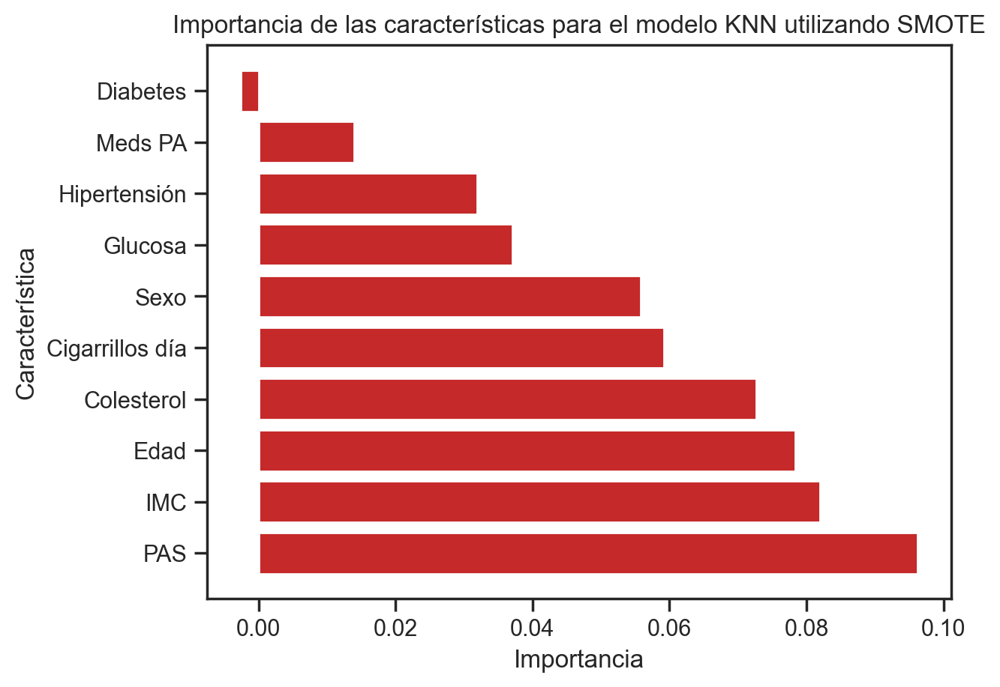

In [132]:
# Create a bar plot with the feature importance
plt.barh(imp_feature['Feature'], imp_feature['Importance'], color='#c52929')

# Add labels and title
plt.xlabel('Importancia')
plt.ylabel('Característica')
plt.title('Importancia de las características para el modelo KNN utilizando SMOTE')

# Show the plot
plt.show()

En cuanto a las conclusiones que se pueden sacar de estos resultados, parece que la característica “PAS” es la más importante para el modelo, seguida de “IMC”, “Edad” y “Colesterol”.

Sin embargo, es importante tener en cuenta que la importancia de la permutación no refleja el valor predictivo intrínseco de una característica por sí sola, sino cuán importante es esta característica para un modelo en particular.

Del gráfico se observa que la característica “Diabetes” presenta un valor negativo en la importancia de la permutación. Un valor negativo en la importancia de la permutación indica que las predicciones en los datos barajados (o ruidosos) son más precisas que los datos reales. Esto significa que la característica no contribuye mucho a las predicciones (importancia cercana a 0), pero el azar hizo que las predicciones en los datos barajados fueran más precisos. Por lo tanto, sería recomendable evaluar el rendimiento del modelo y considerar si eliminar o no la característica “Diabetes” del modelo.

In [133]:
data9 = data10.copy()
data9 = data9.drop('Diabetes', axis=1)

In [134]:
data9

,PAS,Glucosa,Edad,Colesterol,Cigarrillos día,Hipertensión,Meds PA,Sexo,IMC,CHD10
0,106.0,77.0,39,195.0,0.0,0,0.0,1,26.97,0
1,121.0,76.0,46,250.0,0.0,0,0.0,0,28.73,0
2,127.5,70.0,48,245.0,20.0,0,0.0,1,25.34,0
3,150.0,103.0,61,225.0,30.0,1,0.0,0,28.58,1
4,130.0,85.0,46,285.0,23.0,0,0.0,0,23.10,0
...,...,...,...,...,...,...,...,...,...,...
4231,141.0,81.0,58,187.0,0.0,1,0.0,1,24.96,0
4232,168.0,79.0,68,176.0,0.0,1,0.0,1,23.14,1
4233,179.0,86.0,50,313.0,1.0,1,0.0,1,25.97,1
4234,126.5,68.0,51,207.0,43.0,0,0.0,1,19.71,0


In [142]:
X9 = data9.iloc[:,0:-1]  #variables dependientes
y9 = data9.iloc[:,-1]    #variables independientes = CHD10
X9_train, X9_test, y9_train, y9_test = train_test_split(X9, y9, test_size=0.20, random_state = 42)

In [143]:
smote9 = SMOTE()
X9_smote, y9_smote = smote.fit_resample(X9, y9)

In [144]:
print(len(X9))
print(len(y9))
print(len(X9_smote))
print(len(y9_smote))

3653
3653
6196
6196


In [139]:
X9_train_smote, X9_test_smote, y9_train_smote, y9_test_smote = train_test_split(X9_smote, y9_smote, test_size=0.20, random_state = 42)

In [ ]:
scaler = StandardScaler()
X9_train_smote = scaler.fit_transform(X9_train_smote)
X9_test_smote = scaler.transform(X9_test_smote)

In [145]:
KNN_smote = 'K-NeighborsClassifier'
knn_smote = KNeighborsClassifier()
knn_smote.fit(X9_train_smote, y9_train_smote)
knn_predicted_smote_9 = knn_smote.predict(X9_test)
knn_conf_matrix_smote_9 = confusion_matrix(y9_test, knn_predicted_smote_9)
knn_acc_score_smote_9 = accuracy_score(y9_test, knn_predicted_smote_9)
print("confussion matrix")
print(knn_conf_matrix_smote_9)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_smote_9*100,'\n')
print(classification_report(y9_test,knn_predicted_smote_9))

KNeighborsClassifier()

confussion matrix
[[447 166]
 [  6 112]]


Accuracy of K-NeighborsClassifier: 76.47058823529412 

              precision    recall  f1-score   support

           0       0.99      0.73      0.84       613
           1       0.40      0.95      0.57       118

    accuracy                           0.76       731
   macro avg       0.69      0.84      0.70       731
weighted avg       0.89      0.76      0.79       731



Compramos los resultados obtenidos para K-Neighbors Classifier utilizando SMOTE en ambos casos pero eliminando la característica "Diabetes".

In [148]:
print("K-Neighbors Classifier utilizando SMOTE con característica 'Diabetes'")
print(knn_conf_matrix_smote)
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_smote*100,'\n')

print("K-Neighbors Classifier utilizando SMOTE eliminando característica 'Diabetes'")
print(knn_conf_matrix_smote_9)
print("Accuracy of K-NeighborsClassifier:",knn_acc_score_smote_9*100,'\n')

K-Neighbors Classifier utilizando SMOTE con característica 'Diabetes'
[[419 194]
 [ 15 103]]
Accuracy of K-NeighborsClassifier: 71.40902872777018 

K-Neighbors Classifier utilizando SMOTE eliminando característica 'Diabetes'
[[447 166]
 [  6 112]]
Accuracy of K-NeighborsClassifier: 76.47058823529412 



El resultado obtenido eliminando la característica "Diabetes" resulta mucho más óptimo.

A modo comparativo, entre los modelos utilizados con la técnica de SMOTE se calculan las curvas ROC (como queremos comparar todos los modelos utilizandos partiendo de los mismos datos, el cálculo para el modelo KNN se ha realizado sin eliminar la columna "Diabetes").

La curva ROC es una representación gráfica de la sensibilidad (tasa de verdaderos positivos) frente a la especificidad (tasa de falsos positivos) para un sistema de clasificación binario a medida que se varía el umbral de discriminación. Esta curva se utiliza para evaluar el rendimiento de un modelo de clasificación y comparar diferentes modelos.

En el siguiente código, se calculan las tasas de verdaderos y falsos positivos para cada modelo utilizando la función roc_curve de sklearn.metrics. Luego, se utiliza la librería matplotlib para crear un gráfico que muestra las curvas ROC para cada modelo.

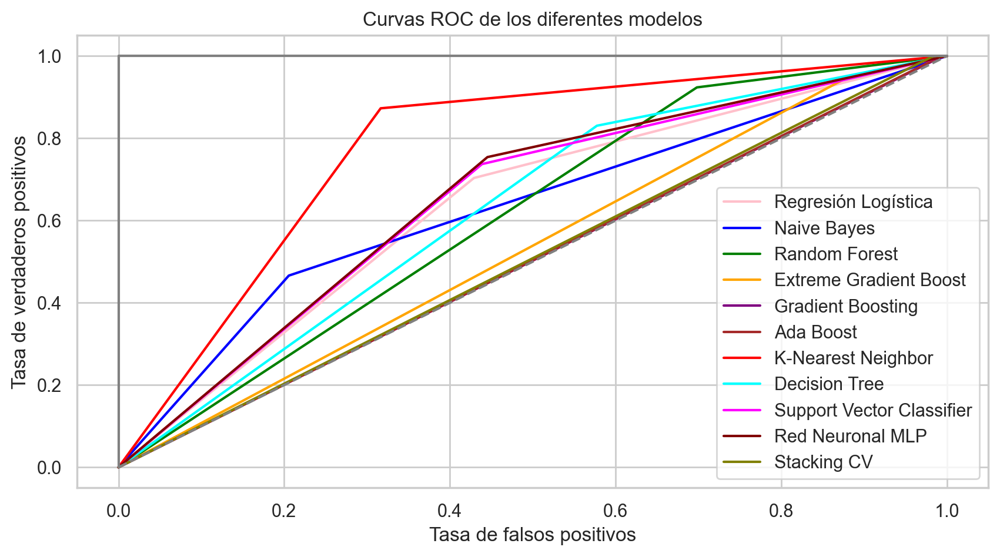

In [161]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the false positive rate, true positive rate, and threshold for each model
lr_smote_false_positive_rate, lr_smote_true_positive_rate, lr_smote_threshold = roc_curve(y_test, lr_predict_smote)
nb_smote_false_positive_rate, nb_smote_true_positive_rate, nb_smote_threshold = roc_curve(y_test, nbpred_smote)
rfc_smote_false_positive_rate, rfc_smote_true_positive_rate, rfc_smote_threshold = roc_curve(y_test, rfc_predicted_smote)
xgb_smote_false_positive_rate, xgb_smote_true_positive_rate, xgb_smote_threshold = roc_curve(y_test, xgb_predicted_smote)
gbc_smote_false_positive_rate, gbc_smote_true_positive_rate, gbc_smote_threshold = roc_curve(y_test, gbc_predicted_smote)
ada_smote_false_positive_rate, ada_smote_true_positive_rate, ada_smote_threshold = roc_curve(y_test, ada_predicted_smote)
knn_smote_false_positive_rate, knn_smote_true_positive_rate, knn_smote_threshold = roc_curve(y_test, knn_predicted_smote)
dtc_smote_false_positive_rate, dtc_smote_true_positive_rate, dtc_smote_threshold = roc_curve(y_test, dtc_predicted_smote)
svc_smote_false_positive_rate, svc_smote_true_positive_rate, svc_smote_threshold = roc_curve(y_test, svc_predicted_smote)
mlpc_smote_false_positive_rate, mlpc_smote_true_positive_rate, mlpc_smote_threshold = roc_curve(y_test, mlpc_predicted_smote)
scv_smote_false_positive_rate, scv_smote_true_positive_rate, scv_smote_threshold = roc_curve(y_test, scv_predicted_smote)

# Set the seaborn style
sns.set_style('whitegrid')

# Create a figure
plt.figure(figsize=(10,5))

# Add a title
plt.title('Curvas ROC de los diferentes modelos')

# Plot the ROC curve for each model
plt.plot(lr_smote_false_positive_rate, lr_smote_true_positive_rate,label='Regresión Logística', color='pink')
plt.plot(nb_smote_false_positive_rate,nb_smote_true_positive_rate,label='Naive Bayes', color='blue')
plt.plot(rfc_smote_false_positive_rate,rfc_smote_true_positive_rate,label='Random Forest', color='green')
plt.plot(xgb_smote_false_positive_rate,xgb_smote_true_positive_rate,label='Extreme Gradient Boost', color='orange')
plt.plot(gbc_smote_false_positive_rate,gbc_smote_true_positive_rate,label='Gradient Boosting', color='purple')
plt.plot(ada_smote_false_positive_rate,ada_smote_true_positive_rate,label='Ada Boost', color='brown')
plt.plot(knn_smote_false_positive_rate,knn_smote_true_positive_rate,label='K-Nearest Neighbor', color='red')
plt.plot(dtc_smote_false_positive_rate,dtc_smote_true_positive_rate,label='Decision Tree', color='#00FFFF')
plt.plot(svc_smote_false_positive_rate,svc_smote_true_positive_rate,label='Support Vector Classifier', color='#FF00FF')
plt.plot(mlpc_smote_false_positive_rate,mlpc_smote_true_positive_rate,label='Red Neuronal MLP', color='#800000')
plt.plot(scv_smote_false_positive_rate,scv_smote_true_positive_rate,label='Stacking CV', color='#808000')

# Add diagonal and vertical lines
plt.plot([0, 1],ls='--', color='grey')
plt.plot([0, 0],[1,0], color='grey')
plt.plot([1, 1], color='grey')

# Add axis labels
plt.ylabel('Tasa de verdaderos positivos')
plt.xlabel('Tasa de falsos positivos')

# Add a legend
plt.legend()

# Show the plot
plt.show();


Del gráfico se observa que el el modelo K-Neighbors Classifier da unos resultados más optivos en cuanto a sensibilidad que el resto de modelos.

Aunque para nuestro proyecto el valor del accuracy para cada modelo empleado no representa si el modelo predice mejor o peor, se ha comparado el resultado obtenido para los distintos modelos empleados.

In [159]:
model_ev = pd.DataFrame({'Model': ['Logistic Regression','Naive Bayes','Random Forest','Extreme Gradient Boost',
                    'Gradient Boosting', 'Ada Boost', 'K-Nearest Neighbour','Decision Tree','Support Vector Machine', 'Neural Network MLP', 'Stacking CV'], 
                         'Accuracy': [lr_acc_score_smote*100, nb_acc_score_smote*100, rfc_acc_score_smote*100, xgb_acc_score_smote*100, gbc_acc_score_smote*100, ada_acc_score_smote*100, knn_acc_score_smote*100, dtc_acc_score_smote*100, svc_acc_score_smote*100, mlpc_acc_score_smote*100, scv_acc_score_smote*100]})
model_ev

,Model,Accuracy
0,Logistic Regression,59.233926
1,Naive Bayes,74.145007
2,Random Forest,40.218878
3,Extreme Gradient Boost,25.307798
4,Gradient Boosting,16.552668
5,Ada Boost,16.689466
6,K-Nearest Neighbour,71.409029
7,Decision Tree,48.837209
8,Support Vector Machine,58.960328
9,Neural Network MLP,58.686731


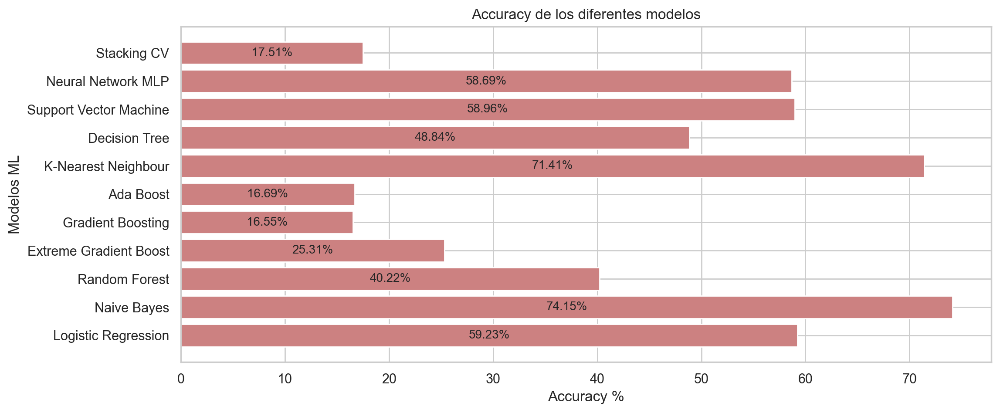

In [162]:
plt.figure(figsize=(12,5))
plt.title("Accuracy de los diferentes modelos")
plt.xlabel("Accuracy %")
plt.ylabel("Modelos ML")
plt.barh(model_ev['Model'], model_ev['Accuracy'], color = '#cc8181')

# Add the accuracy value in the middle of each bar
for index, value in enumerate(model_ev['Accuracy']):
    plt.text(value/2, index, str(round(value, 2)) + '%', ha='center', va='center', fontsize=10)


plt.show();

Los modelos K-Nearest Neighbour y Naive Bayes son los que presenta un valor más elevado de accuracy.

# **Conclusión**

1. El modelo K-Nearest Neighbour ofrece el mejor equilibrio a la hora de predecir y también presenta un valor elevado de accuracy, en comparación con otros modelos.

2. La característica “PAS” es la más importante para el modelo, seguida de “IMC”, “Edad” y “Colesterol”. Mientras que la característica "Diabetes" no contribuye a la predicción del modelo y se ha eliminado de la base de datos con la que trabaja el modelo.

3. La técnica de sobremuestreo SMOTE es la que mejores resultados ofrece a la hora de tratar datos desbalanceados.